# __Machine Learning for Prioritizing Blood Pressure Genes__ 

In [2]:
import re

import numpy as np
import pandas as pd
import scipy.cluster
from numpy import absolute, mean, sort, std
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist
from scipy.stats import spearmanr

regex = re.compile(r"\[|\]|<", re.IGNORECASE)

import matplotlib.pylab as plt
import seaborn as sns
import shap
import statsmodels.api as sm

%matplotlib inline
%config InlineBackend.figure_format ='retina'
from catboost import CatBoostClassifier, Pool, cv

from matplotlib.pyplot import cm
from sklearn import datasets, metrics, model_selection, preprocessing
from sklearn.metrics import *
from sklearn.model_selection import (
    GridSearchCV,
    KFold,
    LeaveOneOut,
    RandomizedSearchCV,
    RepeatedKFold,
    cross_val_predict,
    cross_validate,
    learning_curve,
    train_test_split,
    validation_curve,
    StratifiedKFold
)
from sklearn.calibration import CalibratedClassifierCV
from sklearn.utils import class_weight
from skopt import BayesSearchCV
from skopt.plots import plot_convergence


import sys
import sklearn.neighbors._base
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base
from missingpy import MissForest


sns.set_style("darkgrid")


import warnings

warnings.simplefilter(action="ignore", category=FutureWarning)
from warnings import filterwarnings

filterwarnings("ignore")

seed = 0

In [3]:
data = pd.read_csv("training_cleaned.csv", header=0, sep=",")
Y_label = data[["Gene", "BPlabel"]]

In [4]:
data["BPlabel_encoded"] = data["BPlabel"].map(
    {'most likely':0,'probable':1, 'least likely':2}
)
Y = data["BPlabel_encoded"]
classes_weights_all = class_weight.compute_sample_weight(
    class_weight='balanced',
    y=Y
)
data = data.drop(["BPlabel"], 1)
data.shape

(293, 22)

### Load Boruta Shap Feature Selected Features

In [5]:
X = pd.read_csv("selected_features_training_data.csv", header=0)
X.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X.columns.values
]

In [6]:
df_gene = data[["Gene"]]

X_genes = pd.concat([df_gene, X], axis=1)

X_genes = X_genes.set_index("Gene")

In [7]:
X_train, X_test, Y_train, Y_test = train_test_split(
    X, Y, test_size=0.2, random_state=0
)

classes_weights_train = class_weight.compute_sample_weight(
    class_weight='balanced',
    y=Y_train
)

In [8]:
# Model parameters built from repeated nested CV benchmarking
cb = CatBoostClassifier(depth=3, iterations=50, learning_rate=0.2, random_seed=seed, verbose=False)

In [12]:
cb.fit(X,
       Y,sample_weight=classes_weights_all,
       verbose=False,
       plot=True)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [13]:
classes_weights_test = class_weight.compute_sample_weight(
    class_weight='balanced',
    y=Y_train
)
cal_clf = CalibratedClassifierCV(cb, method="sigmoid", cv="prefit")
cal_clf.fit(X_train, Y_train, sample_weight=classes_weights_test)

CalibratedClassifierCV(base_estimator=<catboost.core.CatBoostClassifier object at 0x7fe2f93d3c10>,
                       cv='prefit')

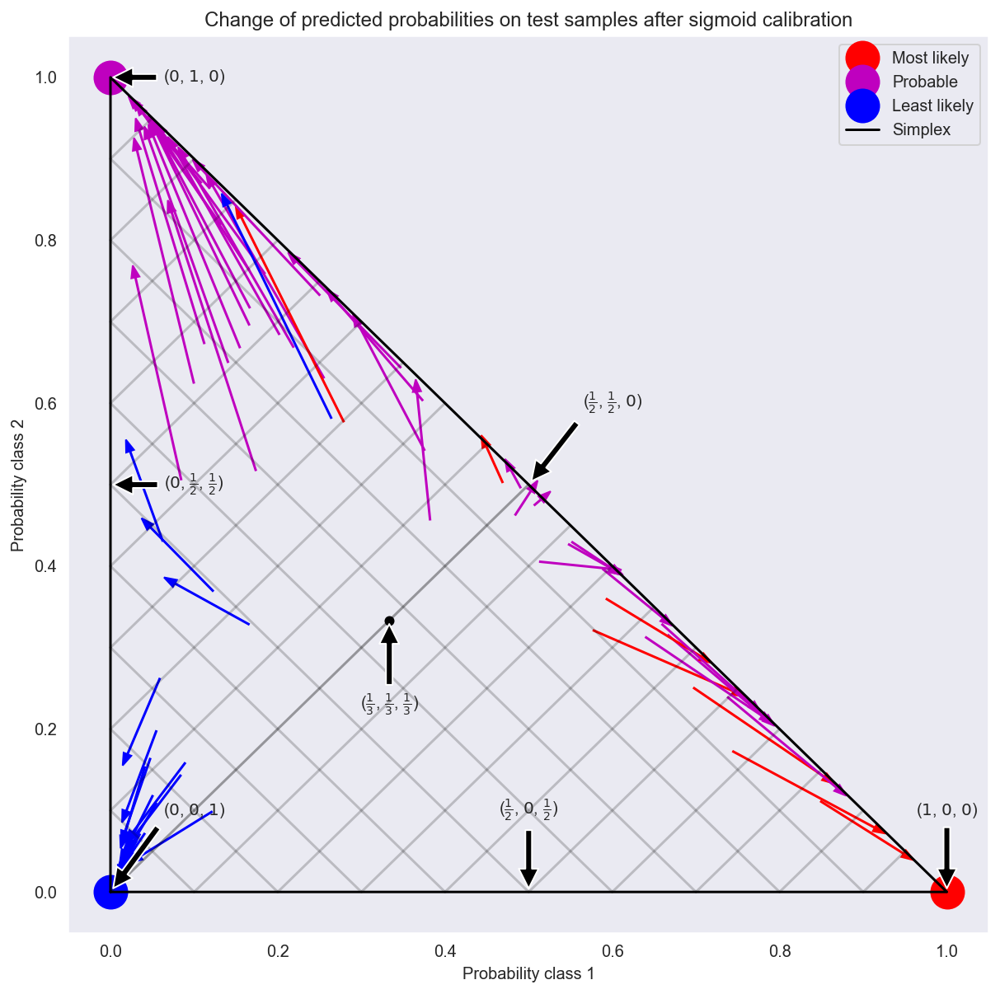

In [14]:
Y_test = Y_test.to_numpy()
X_test = X_test.to_numpy()

plt.figure(figsize=(10, 10))
colors = ["r", "m", "b"]

clf_probs = cb.predict_proba(X_test)
cal_clf_probs = cal_clf.predict_proba(X_test)
# Plot arrows
for i in range(clf_probs.shape[0]):
    plt.arrow(
        clf_probs[i, 0],
        clf_probs[i, 1],
        cal_clf_probs[i, 0] - clf_probs[i, 0],
        cal_clf_probs[i, 1] - clf_probs[i, 1],
        color=colors[Y_test[i]],
        head_width=1e-2,
    )

# Plot perfect predictions, at each vertex
plt.plot([1.0], [0.0], "ro", ms=20, label="Most likely")
plt.plot([0.0], [1.0], "mo", ms=20, label="Probable")
plt.plot([0.0], [0.0], "bo", ms=20, label="Least likely")

# Plot boundaries of unit simplex
plt.plot([0.0, 1.0, 0.0, 0.0], [0.0, 0.0, 1.0, 0.0], "k", label="Simplex")

# Annotate points 6 points around the simplex, and mid point inside simplex
plt.annotate(
    r"($\frac{1}{3}$, $\frac{1}{3}$, $\frac{1}{3}$)",
    xy=(1.0 / 3, 1.0 / 3),
    xytext=(1.0 / 3, 0.23),
    xycoords="data",
    arrowprops=dict(facecolor="black", shrink=0.05),
    horizontalalignment="center",
    verticalalignment="center",
)
plt.plot([1.0 / 3], [1.0 / 3], "ko", ms=5)
plt.annotate(
    r"($\frac{1}{2}$, $0$, $\frac{1}{2}$)",
    xy=(0.5, 0.0),
    xytext=(0.5, 0.1),
    xycoords="data",
    arrowprops=dict(facecolor="black", shrink=0.05),
    horizontalalignment="center",
    verticalalignment="center",
)
plt.annotate(
    r"($0$, $\frac{1}{2}$, $\frac{1}{2}$)",
    xy=(0.0, 0.5),
    xytext=(0.1, 0.5),
    xycoords="data",
    arrowprops=dict(facecolor="black", shrink=0.05),
    horizontalalignment="center",
    verticalalignment="center",
)
plt.annotate(
    r"($\frac{1}{2}$, $\frac{1}{2}$, $0$)",
    xy=(0.5, 0.5),
    xytext=(0.6, 0.6),
    xycoords="data",
    arrowprops=dict(facecolor="black", shrink=0.05),
    horizontalalignment="center",
    verticalalignment="center",
)
plt.annotate(
    r"($0$, $0$, $1$)",
    xy=(0, 0),
    xytext=(0.1, 0.1),
    xycoords="data",
    arrowprops=dict(facecolor="black", shrink=0.05),
    horizontalalignment="center",
    verticalalignment="center",
)
plt.annotate(
    r"($1$, $0$, $0$)",
    xy=(1, 0),
    xytext=(1, 0.1),
    xycoords="data",
    arrowprops=dict(facecolor="black", shrink=0.05),
    horizontalalignment="center",
    verticalalignment="center",
)
plt.annotate(
    r"($0$, $1$, $0$)",
    xy=(0, 1),
    xytext=(0.1, 1),
    xycoords="data",
    arrowprops=dict(facecolor="black", shrink=0.05),
    horizontalalignment="center",
    verticalalignment="center",
)
# Add grid
plt.grid(False)
for x in [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    plt.plot([0, x], [x, 0], "k", alpha=0.2)
    plt.plot([0, 0 + (1 - x) / 2], [x, x + (1 - x) / 2], "k", alpha=0.2)
    plt.plot([x, x + (1 - x) / 2], [0, 0 + (1 - x) / 2], "k", alpha=0.2)

plt.title("Change of predicted probabilities on test samples after sigmoid calibration")
plt.xlabel("Probability class 1")
plt.ylabel("Probability class 2")
plt.xlim(-0.05, 1.05)
plt.ylim(-0.05, 1.05)
_ = plt.legend(loc="best")

In the figure above, each vertex of the simplex represents a perfectly predicted class (e.g., 1, 0, 0). The mid point inside the simplex represents predicting the three classes with equal probability (i.e., 1/3, 1/3, 1/3). Each arrow starts at the uncalibrated probabilities and end with the arrow head at the calibrated probability. The color of the arrow represents the true class of that test sample.

The uncalibrated classifier is overly confident in its predictions and incurs a large log loss. The calibrated classifier incurs a lower log loss due to two factors. First, notice in the figure above that the arrows generally point away from the edges of the simplex, where the probability of one class is 0. Second, a large proportion of the arrows point towards the true class, e.g., green arrows (samples where the true class is ‘green’) generally point towards the green vertex. This results in fewer over-confident, 0 predicted probabilities and at the same time an increase in the predicted probabilities of the correct class. Thus, the calibrated classifier produces more accurate predicted probabilities that incur a lower log loss

We can show this objectively by comparing the log loss of the uncalibrated and calibrated classifiers on the predictions of the 1000 test samples. Note that an alternative would have been to increase the number of base estimators (trees) of the RandomForestClassifier which would have resulted in a similar decrease in log loss.

In [15]:
from sklearn.metrics import log_loss

score = log_loss(Y_test, clf_probs)
cal_score = log_loss(Y_test, cal_clf_probs)

print("Log-loss of")
print(f" * uncalibrated classifier: {score:.3f}")
print(f" * calibrated classifier: {cal_score:.3f}")

Log-loss of
 * uncalibrated classifier: 0.509
 * calibrated classifier: 0.452


In [16]:
print(cb.get_all_params())

{'nan_mode': 'Min', 'eval_metric': 'MultiClass', 'iterations': 50, 'sampling_frequency': 'PerTree', 'leaf_estimation_method': 'Newton', 'grow_policy': 'SymmetricTree', 'penalties_coefficient': 1, 'boosting_type': 'Plain', 'model_shrink_mode': 'Constant', 'feature_border_type': 'GreedyLogSum', 'bayesian_matrix_reg': 0.10000000149011612, 'force_unit_auto_pair_weights': False, 'l2_leaf_reg': 3, 'random_strength': 1, 'rsm': 1, 'boost_from_average': False, 'model_size_reg': 0.5, 'pool_metainfo_options': {'tags': {}}, 'use_best_model': False, 'class_names': [0, 1, 2], 'random_seed': 0, 'depth': 3, 'posterior_sampling': False, 'border_count': 254, 'bagging_temperature': 1, 'classes_count': 0, 'auto_class_weights': 'None', 'sparse_features_conflict_fraction': 0, 'leaf_estimation_backtracking': 'AnyImprovement', 'best_model_min_trees': 1, 'model_shrink_rate': 0, 'min_data_in_leaf': 1, 'loss_function': 'MultiClass', 'learning_rate': 0.20000000298023224, 'score_function': 'Cosine', 'task_type': '

In [ ]:
pool = Pool(X, Y,  feature_names=list(X.columns))
cb.plot_tree(
    tree_idx=0,
    pool=pool
)

In [164]:

params = {"iterations": 50,
          "depth": 3,
          'learning_rate':0.2,
           "loss_function": "MultiClass",
          "verbose": False}

scores = cv(Pool(X, Y),
            params,
            fold_count=10, 
            plot="True")

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/10]

bestTest = 0.7490181653
bestIteration = 46

Training on fold [1/10]

bestTest = 0.5551243342
bestIteration = 46

Training on fold [2/10]

bestTest = 0.6575425833
bestIteration = 36

Training on fold [3/10]

bestTest = 0.680274656
bestIteration = 35

Training on fold [4/10]

bestTest = 0.5516645066
bestIteration = 47

Training on fold [5/10]

bestTest = 0.4490381562
bestIteration = 49

Training on fold [6/10]

bestTest = 0.6236645653
bestIteration = 49

Training on fold [7/10]

bestTest = 0.6351054699
bestIteration = 30

Training on fold [8/10]

bestTest = 0.4971515505
bestIteration = 44

Training on fold [9/10]

bestTest = 0.586017165
bestIteration = 46



In [165]:
data = pd.DataFrame({'feature_importance': cb.get_feature_importance(Pool(X,Y)), 
              'feature_names': X.columns}).sort_values(by=['feature_importance'], 
                                                       ascending=False)

In [166]:
data

,feature_importance,feature_names
0,21.598774,HIPred
3,17.758958,mousescore_Exomiser
5,17.725237,pLI_ExAC
2,17.000171,Pituitary_GTExTPM
1,13.732340,Heart - Atrial Appendage_GTExTPM
4,12.184519,SDI


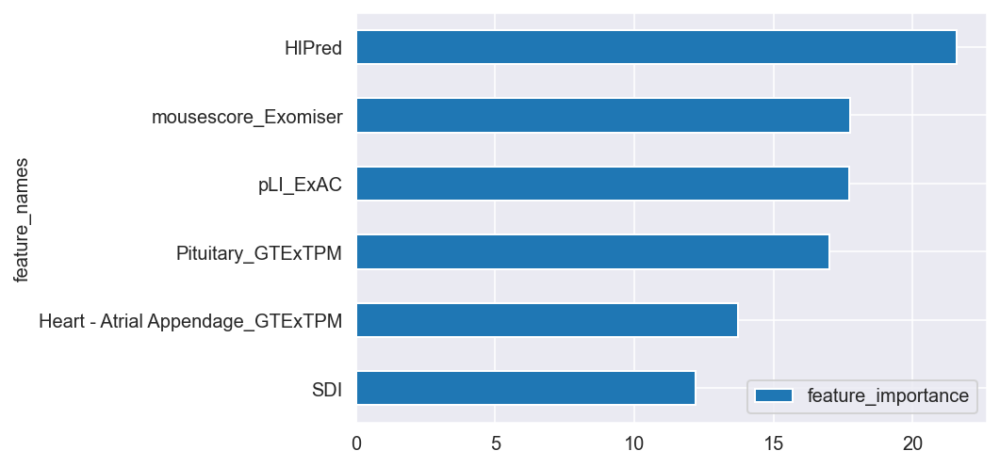

In [167]:
data[:7].sort_values(by=['feature_importance'], ascending=True).plot.barh(x='feature_names', y='feature_importance')


In [169]:
target_names = ['most likely', 'probable', 'least likely']

cal_clf = CalibratedClassifierCV(cb, method="sigmoid", cv="prefit")
cal_clf.fit(X_train, Y_train, sample_weight=classes_weights_train)

#cb.fit(X_train, Y_train, sample_weight=classes_weights_train)
predictions = list(cal_clf.predict(X_test))
print(classification_report(Y_test, predictions, target_names=target_names))

              precision    recall  f1-score   support

 most likely       0.33      0.71      0.45         7
    probable       0.85      0.69      0.76        32
least likely       1.00      0.90      0.95        20

    accuracy                           0.76        59
   macro avg       0.73      0.77      0.72        59
weighted avg       0.84      0.76      0.79        59



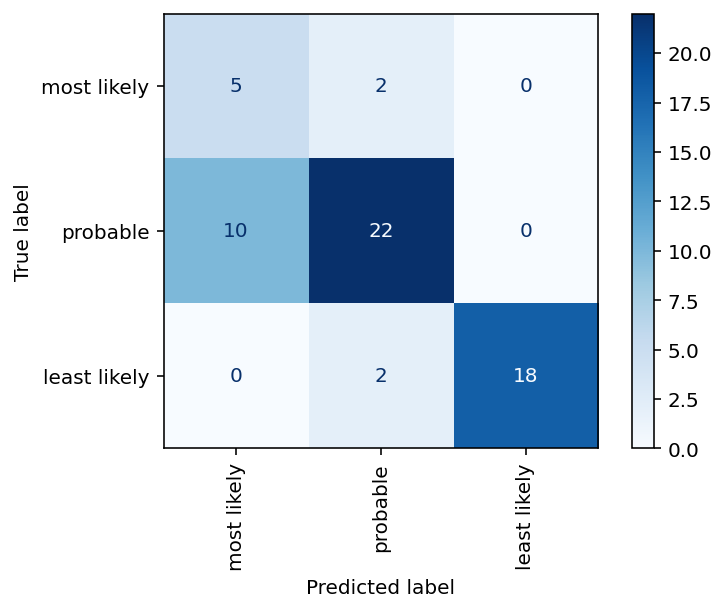

In [170]:
cal_clf.fit(X_train, Y_train, sample_weight=classes_weights_train)
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams["font.size"] = "16"
class_names = ['most likely', 'probable', 'least likely']
%matplotlib inline
disp = plot_confusion_matrix(cal_clf, X_test, Y_test, display_labels=class_names, cmap=plt.cm.Blues, xticks_rotation='vertical')
plt.savefig('confusion_cb_train.png', format='png', dpi=300, bbox_inches = "tight")

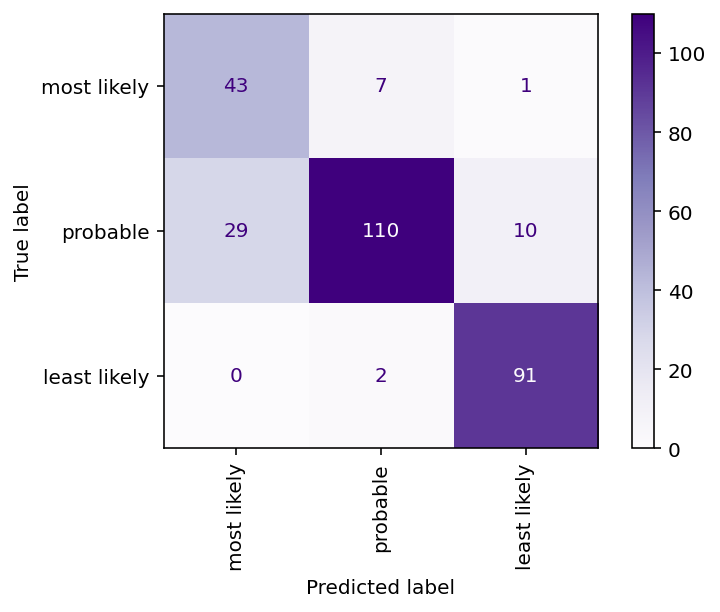

In [172]:
cal_clf.fit(X, Y, sample_weight=classes_weights_all)
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams["font.size"] = "16"
class_names = ['most likely', 'probable', 'least likely']
%matplotlib inline
disp = plot_confusion_matrix(cal_clf, X, Y, display_labels=class_names, cmap=plt.cm.Purples, xticks_rotation='vertical')
plt.savefig('confusion_cb_all.png', format='png', dpi=300, bbox_inches = "tight")

### Training Data Prediction Visualization:

In [173]:
cal_clf.fit(X, Y, sample_weight=classes_weights_all)
pred = cal_clf.predict(X)
predictions = np.concatenate(pred, axis=0 )

output = pd.Series(data=predictions, index=X.index, name="cb_label")


df_total_training = pd.concat([X, output], axis=1)


Y_label['Label type'] = 'Training label'
#Y_label = Y_label.set_index("Gene")
output = output.to_frame()
output["BPlabel"] = output["cb_label"].map(
    {1:'most likely', 2:'probable', 3:'least likely'}
)

output['Label type'] = 'Predicted label'
#df_total = pd.concat([X, output, Y_label], axis=1)
df_total = Y_label.append(output)
#df_total.append(Y_label)

plt.rcParams.update(plt.rcParamsDefault)

sns.set_style("darkgrid")
plt.rcParams["xtick.labelsize"] = 18
plt.rcParams["ytick.labelsize"] = 18
plt.rcParams["legend.fontsize"] = 18
plt.rcParams["legend.title_fontsize"] = 18
%matplotlib inline
sns.set_style("darkgrid")
ax = sns.catplot(x="BPlabel", hue="Label type", kind="count", 
                 height=8, aspect=1.5,
                 data=df_total, order=['most likely', 'probable', 'least likely'])
ax.set_xlabels('Label', fontsize=18) 
ax.set_ylabels('Count', fontsize=18) 
ax.savefig('labelling.png', format='png', dpi=300, bbox_inches = "tight")

ValueError: zero-dimensional arrays cannot be concatenated

In [181]:
predictions = list(cal_clf.predict(X))

output = pd.Series(data=predictions, index=X_genes.index, name="cb_label")

output = output.to_frame()
output.reset_index(level=0, inplace=True)

output

,Gene,cb_label
0,ABCC9,0
1,AC006455.1,2
2,AC007216.2,2
3,AC007461.1,2
4,AC008498.1,2
...,...,...
288,YES1,1
289,Z98049.1,2
290,ZAP70,1
291,ZMYM6NB,2


In [183]:
data = pd.read_csv("training_cleaned.csv", header=0, sep=",")
data["BPlabel_encoded"] = data["BPlabel"].map(
    {'most likely':0,'probable':1, 'least likely':2}
)
df_b = data[["BPlabel_encoded"]]

df_c = pd.concat([output, df_b], axis=1)
df_c

,Gene,cb_label,BPlabel_encoded
0,ABCC9,0,0
1,AC006455.1,2,2
2,AC007216.2,2,2
3,AC007461.1,2,2
4,AC008498.1,2,2
...,...,...,...
288,YES1,1,1
289,Z98049.1,2,2
290,ZAP70,1,1
291,ZMYM6NB,2,2


### SHAP Feature Importance Visualization:

In [234]:
class_names = ['most likely','probable', 'least likely']
cb.fit(X_train, Y_train,sample_weight=classes_weights_train)
df3 = pd.DataFrame(data=X, columns=X.columns)
df3.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X.columns.values
]
X_importance = X_test
explainer = shap.TreeExplainer(cb)
shap_values = explainer.shap_values(X_importance)
X_importance = pd.DataFrame(data=X_test, columns=df3.columns)

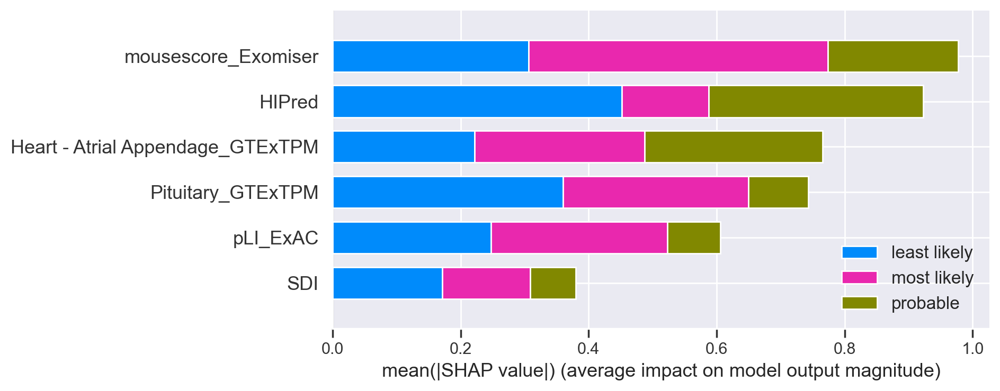

In [235]:
fig, ax = plt.subplots()
shap.summary_plot(shap_values, X_importance, class_names = class_names)
fig.savefig('shap_summary.png', format='png', dpi=300, bbox_inches = "tight")

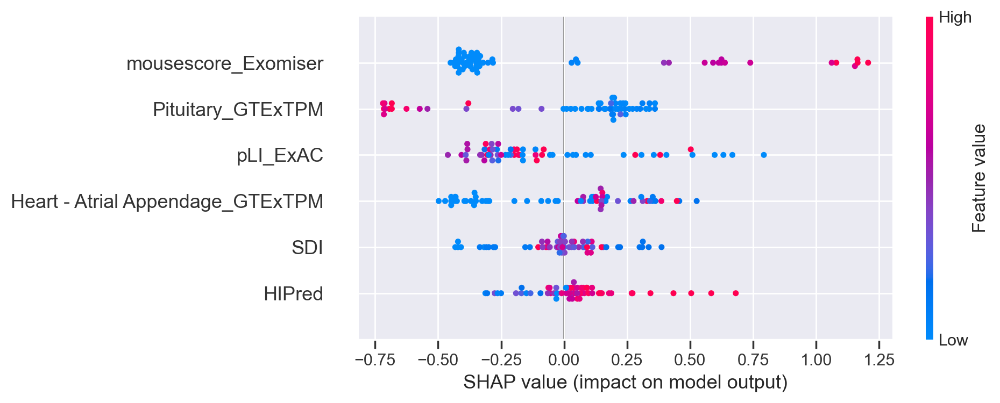

In [236]:
sns.set_style("darkgrid")
fig, ax = plt.subplots()
shap.summary_plot(shap_values[0], X_importance, feature_names = X_importance.columns)
fig.savefig('shap_summary_most_likely.png', format='png', dpi=300, bbox_inches = "tight")

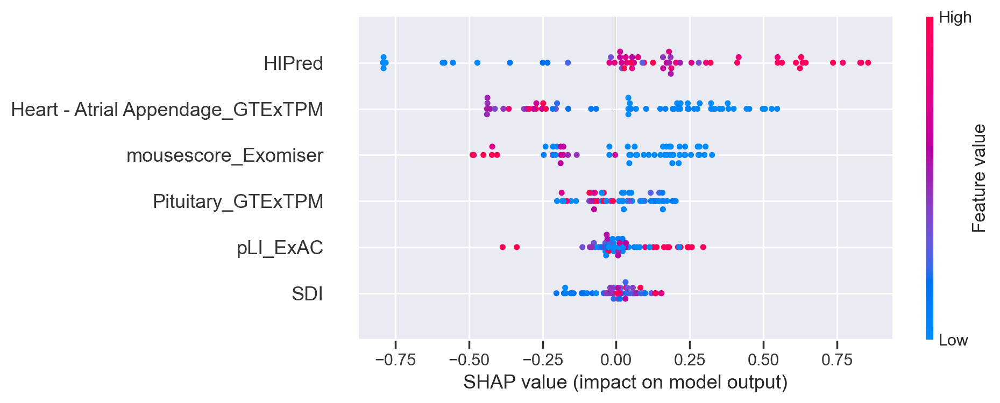

In [237]:
fig, ax = plt.subplots()
shap.summary_plot(shap_values[1], X_importance, feature_names = X_importance.columns)
fig.savefig('shap_summary_probable.png', format='png', dpi=300, bbox_inches = "tight")

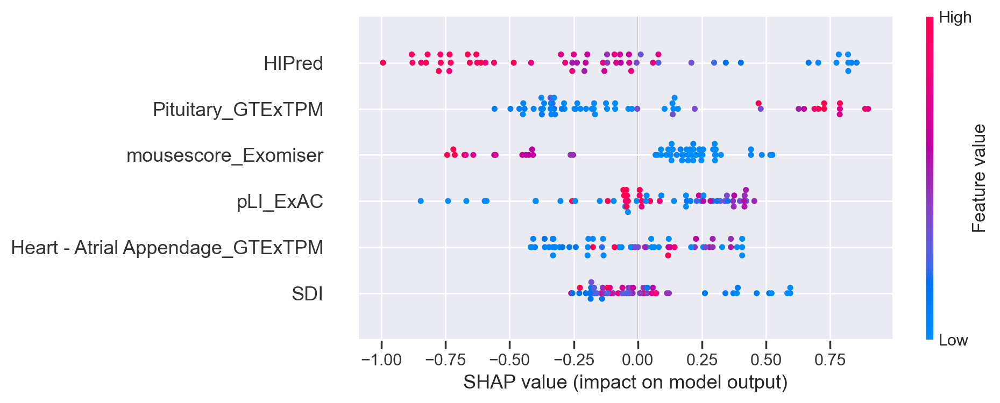

In [238]:
fig, ax = plt.subplots()
shap.summary_plot(shap_values[2], X_importance, feature_names = X_importance.columns)
fig.savefig('shap_summary_least_likely.png', format='png', dpi=300, bbox_inches = "tight")

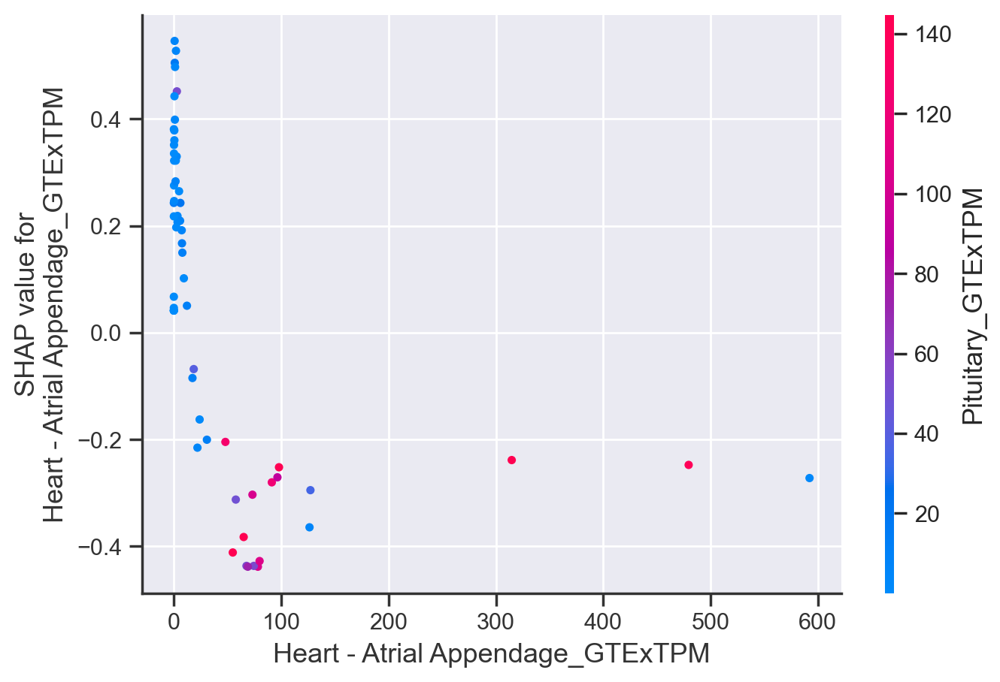

In [239]:
shap.dependence_plot(1, shap_values[1], X_importance.values, feature_names=X_importance.columns)

In [243]:
from catboost import EFstrType, Pool
shap_values = cb.get_feature_importance(Pool(data[X_genes.columns]),type=EFstrType.ShapValues,verbose=100)
shap_interaction_values = cb.get_feature_importance(Pool(data[X_genes.columns]),type=EFstrType.ShapInteractionValues,verbose=100)

Processing trees...
50/50 trees processed	passed time: 455us	remaining time: 0us
Processing documents...
128/293 documents processed	passed time: 1.8ms	remaining time: 2.33ms
256/293 documents processed	passed time: 3.28ms	remaining time: 474us
293/293 documents processed	passed time: 3.92ms	remaining time: 0us


In [244]:
expected_value = explainer.expected_value
if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer expected value: {expected_value}")

Explainer expected value: 0.2721629268923493


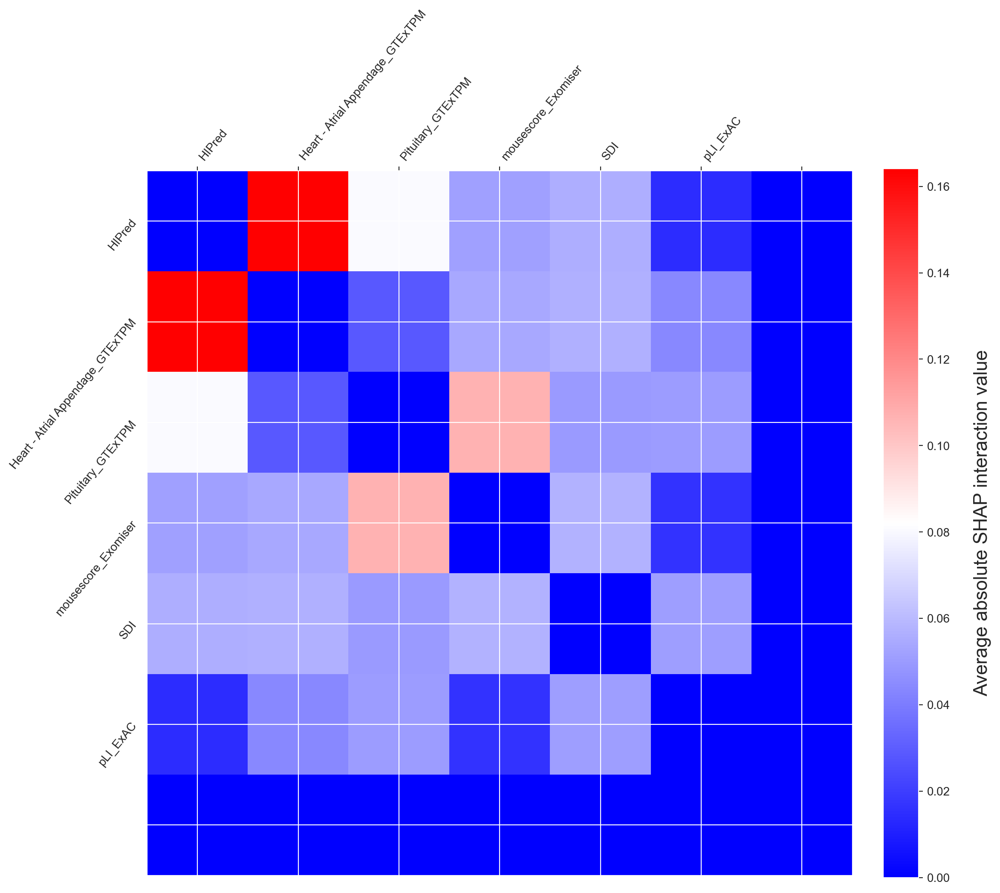

In [245]:
plt.rcParams.update(plt.rcParamsDefault)
X_interaction = pd.DataFrame(data=X, columns=X.columns)

sns.set_style("darkgrid")
tmp = np.abs(shap_interaction_values[0]).sum(0)
for i in range(tmp.shape[0]):
    tmp[i, i] = 0
inds = np.argsort(-tmp.sum(0))[:50]
tmp2 = tmp[inds, :][:, inds]


f = plt.figure(figsize=(12, 12))
plt.imshow(
    tmp2, cmap="bwr"
)  
plt.yticks(
    range(tmp2.shape[0]),
    labels=(X.columns),
    rotation=50.4,
    horizontalalignment="right",
)
plt.xticks(
    range(tmp2.shape[0]),
    labels=(X.columns),
    rotation=50.4,
    horizontalalignment="left",
)
plt.gca().xaxis.tick_top()
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label("Average absolute SHAP interaction value", size=16, labelpad=20)
plt.rcParams.update({"font.size": 16})
plt.tight_layout()
f.savefig("shap_interactions_ml.png", format='png', dpi=300)


#plt.show()


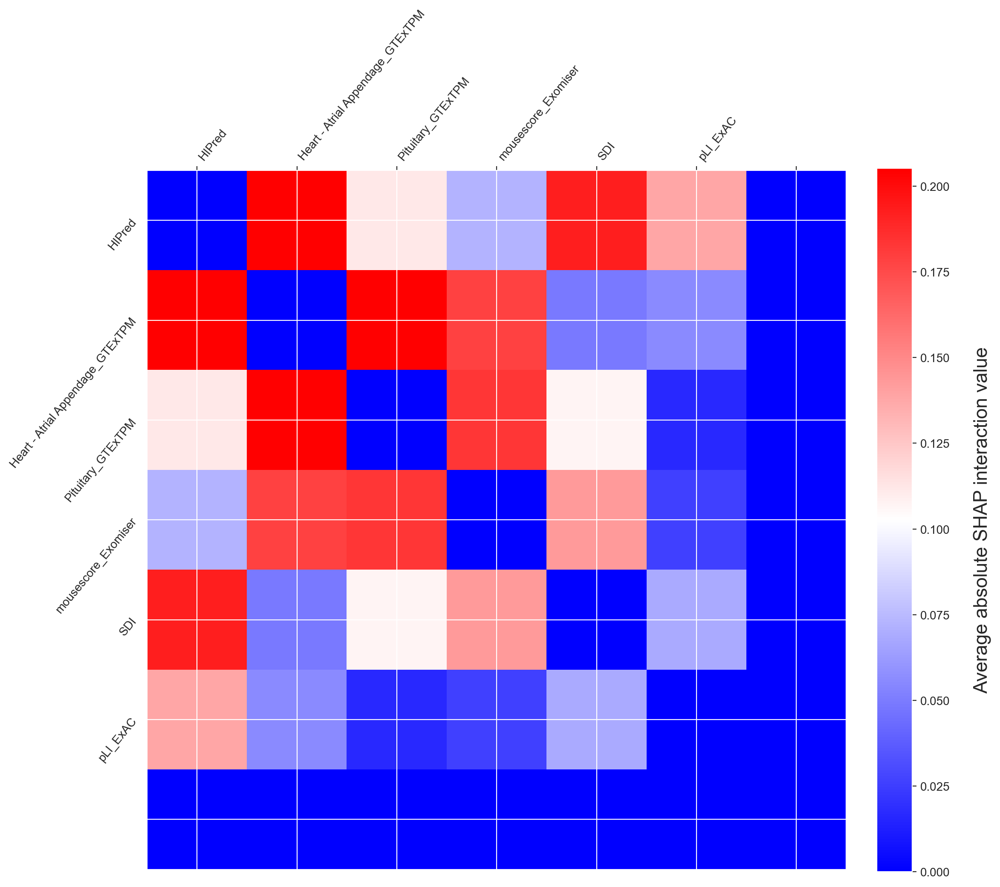

In [246]:
plt.rcParams.update(plt.rcParamsDefault)
X_interaction = pd.DataFrame(data=X, columns=X.columns)

sns.set_style("darkgrid")
tmp = np.abs(shap_interaction_values[1]).sum(0)
for i in range(tmp.shape[0]):
    tmp[i, i] = 0
inds = np.argsort(-tmp.sum(0))[:50]
tmp2 = tmp[inds, :][:, inds]


f = plt.figure(figsize=(12, 12))
plt.imshow(
    tmp2, cmap="bwr"
)  
plt.yticks(
    range(tmp2.shape[0]),
    labels=(X.columns),
    rotation=50.4,
    horizontalalignment="right",
)
plt.xticks(
    range(tmp2.shape[0]),
    labels=(X.columns),
    rotation=50.4,
    horizontalalignment="left",
)
plt.gca().xaxis.tick_top()
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label("Average absolute SHAP interaction value", size=16, labelpad=20)
plt.rcParams.update({"font.size": 16})
plt.tight_layout()
f.savefig("shap_interactions_probable.png", format='png', dpi=300)


#plt.show()


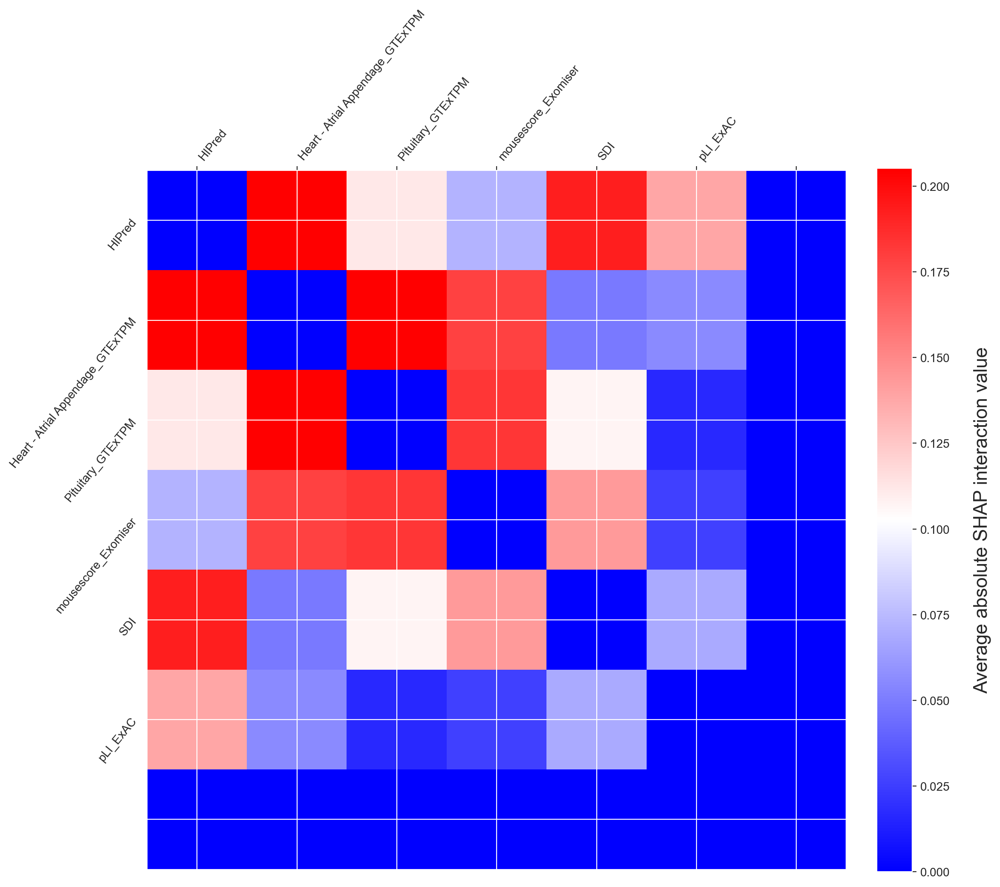

In [247]:
plt.rcParams.update(plt.rcParamsDefault)
X_interaction = pd.DataFrame(data=X, columns=X.columns)

sns.set_style("darkgrid")
tmp = np.abs(shap_interaction_values[2]).sum(0)
for i in range(tmp.shape[0]):
    tmp[i, i] = 0
inds = np.argsort(-tmp.sum(0))[:50]
tmp2 = tmp[inds, :][:, inds]


f = plt.figure(figsize=(12, 12))
plt.imshow(
    tmp2, cmap="bwr"
)  
plt.yticks(
    range(tmp2.shape[0]),
    labels=(X.columns),
    rotation=50.4,
    horizontalalignment="right",
)
plt.xticks(
    range(tmp2.shape[0]),
    labels=(X.columns),
    rotation=50.4,
    horizontalalignment="left",
)
plt.gca().xaxis.tick_top()
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label("Average absolute SHAP interaction value", size=16, labelpad=20)
plt.rcParams.update({"font.size": 16})
plt.tight_layout()
f.savefig("shap_interactions_ll.png", format='png', dpi=300)


#plt.show()


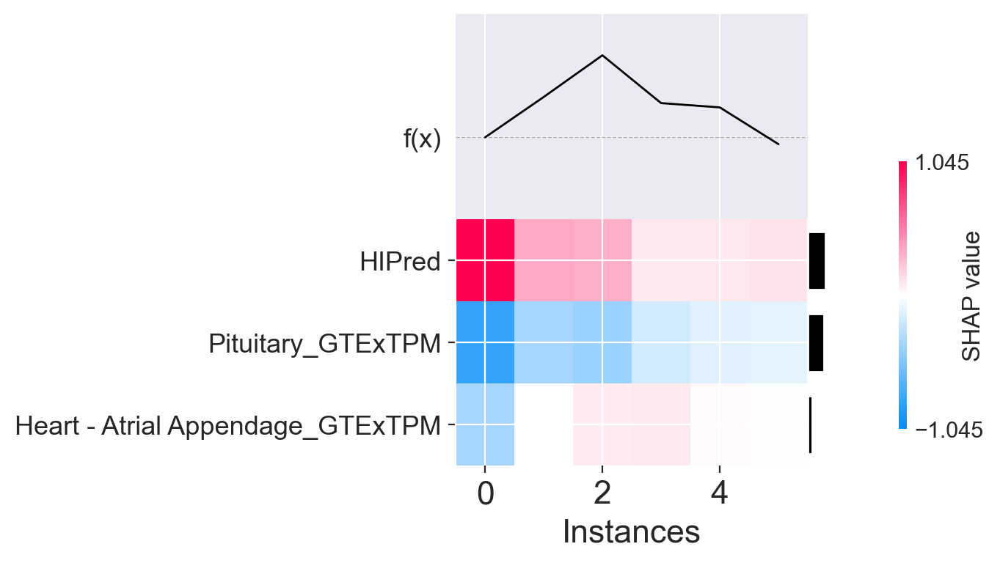

In [248]:
# https://shap.readthedocs.io/en/latest/example_notebooks/api_examples/plots/heatmap.html

shap_values = explainer(X)
fig, ax = plt.subplots()
shap.plots.heatmap(shap_values[0], max_display=6)
fig.savefig('mostlikely_shap_heatmap.svg', format='svg', dpi=1200, bbox_inches = "tight")

In [249]:
select = range(6)
features = X.iloc[select]
features_display = X.loc[features.index]
shap_values = explainer.shap_values(X)


In [250]:
shap.initjs()
shap.force_plot(
    explainer.expected_value[0],
    shap_values[0],
    X.iloc[:293, :],
    features_display,
)

In [251]:
output_of_force_plot = shap.force_plot(
    explainer.expected_value[0],
    shap_values[0],
    X.iloc[:293, :],
    features_display,
)
file = "mostlikely_force_plot.html"
shap.save_html(file, output_of_force_plot)

## Decision Plots:
- The plot is centered on the x-axis at explainer.expected_value. All SHAP values are relative to the model's expected value like a linear model's effects are relative to the intercept.
- The y-axis lists the model's features. By default, the features are ordered by descending importance. The importance is calculated over the observations plotted. _This is usually different than the importance ordering for the entire dataset._ In addition to feature importance ordering, the decision plot also supports hierarchical cluster feature ordering and user-defined feature ordering.
- Each observation's prediction is represented by a colored line. At the top of the plot, each line strikes the x-axis at its corresponding observation's predicted value. This value determines the color of the line on a spectrum.
- Moving from the bottom of the plot to the top, SHAP values for each feature are added to the model's base value. This shows how each feature contributes to the overall prediction.
- At the bottom of the plot, the observations converge at explainer.expected_value.

In [252]:
explainer = shap.TreeExplainer(cb)
shap_values = explainer.shap_values(X)
expected_value = explainer.expected_value

In [253]:
expected_value

[0.029620702146956706, 0.2721629268923493, -0.3017836290393051]

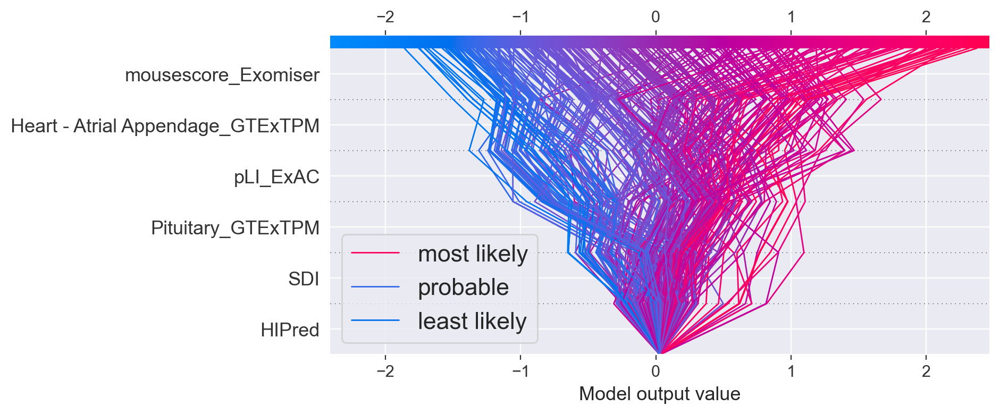

In [254]:
shap.decision_plot(
    expected_value[0],
    shap_values[0],
    feature_names=list(X),
    ignore_warnings=True,
    legend_labels=class_names,
)

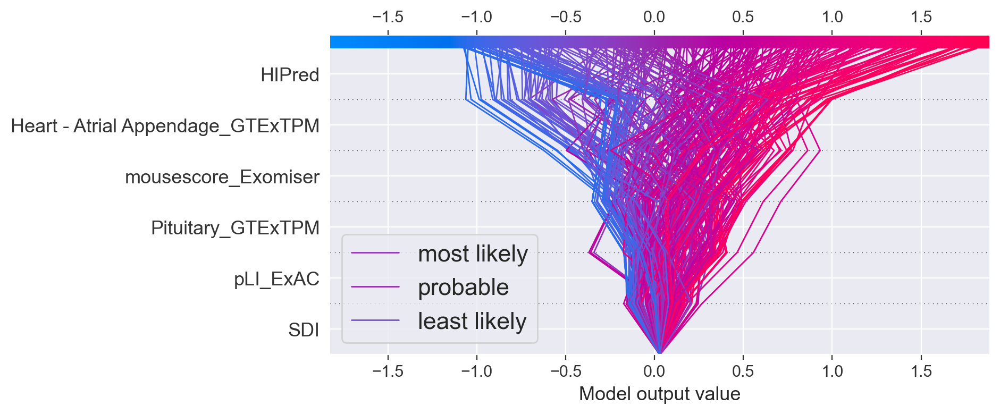

In [255]:
shap.decision_plot(
    expected_value[0],
    shap_values[1],
    feature_names=list(X),
    ignore_warnings=True,
    legend_labels=class_names,
)

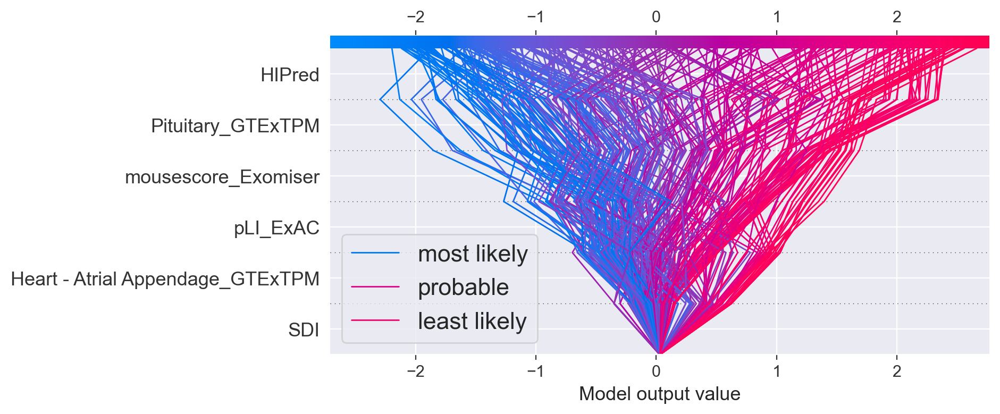

In [256]:
shap.decision_plot(
    expected_value[0],
    shap_values[2],
    feature_names=list(X),
    ignore_warnings=True,
    legend_labels=class_names,
)

In [257]:
row_index=0
shap.multioutput_decision_plot(
    expected_value,
    explainer.shap_values(X),
    row_index=row_index,
    feature_names=list(X),
    ignore_warnings=True,
    highlight = predictions[row_index],
    legend_labels=class_names,
)

KeyError: 0

# Shapley Value Clustering for the most likely gene group

In [258]:
cb.fit(X, Y,sample_weight=classes_weights_all)
df3 = pd.DataFrame(data=X, columns=X.columns)
df3.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X.columns.values
]

explainer = shap.TreeExplainer(cb)
shap_values = explainer.shap_values(X)

In [259]:
features = X.columns.values.tolist()
shapdf = pd.DataFrame(data=np.array(shap_values[0]), columns=features)
#shapdf["shap_average"] = shapdf.mean(axis=1)
shapdf

,HIPred,Heart - Atrial Appendage_GTExTPM,Pituitary_GTExTPM,mousescore_Exomiser,SDI,pLI_ExAC
0,0.162297,0.216976,0.405540,1.166419,0.057468,0.076444
1,-0.039500,0.045196,-0.622268,-0.363405,-0.061991,-0.354651
2,-0.054082,0.060572,-0.550457,-0.442562,-0.039985,-0.361568
3,0.004783,0.045192,-0.632406,-0.209340,-0.026623,-0.353024
4,-0.049320,0.035684,-0.632406,-0.442562,-0.048550,-0.353889
...,...,...,...,...,...,...
288,0.066590,0.104358,0.095722,-0.402893,0.025775,-0.175578
289,-0.056813,0.043910,-0.632406,-0.454749,-0.075970,-0.353024
290,0.143322,-0.239494,0.253868,-0.347580,0.048309,-0.287319
291,-0.027525,0.043910,-0.632406,-0.458048,-0.048550,-0.352262


In [260]:
from sklearn.cluster import AgglomerativeClustering 
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as shc


pca = PCA(n_components = 4) 
X_principal = pca.fit_transform(shapdf) 
X_principal = pd.DataFrame(X_principal) 
X_principal.columns = ['P1', 'P2', 'P3', 'P4'] 

Eigenvectors 
[[ 0.11904482 -0.25575062 -0.25584544  0.4235718   0.27949551  0.77293742]
 [ 0.12505445 -0.44892983 -0.6754616   0.16524731  0.13399151 -0.53039101]
 [ 0.23900115  0.49731181  0.12687688  0.77656164  0.04623067 -0.272537  ]
 [ 0.94151126 -0.13427624  0.20126092 -0.23448492 -0.00097181  0.00603054]
 [ 0.0792964  -0.04043018 -0.23182491  0.15050647 -0.94401951  0.15655562]
 [ 0.14260717  0.68269311 -0.60658738 -0.33555462  0.10304118  0.14976873]]

Eigenvalues 
[0.28691436 0.1519827  0.09956792 0.06118453 0.02103534 0.03015889]
[44.083447750325256, 23.351641779170844, 15.298283752866668, 9.400801330432722, 4.633814844689232, 3.232010542515282]


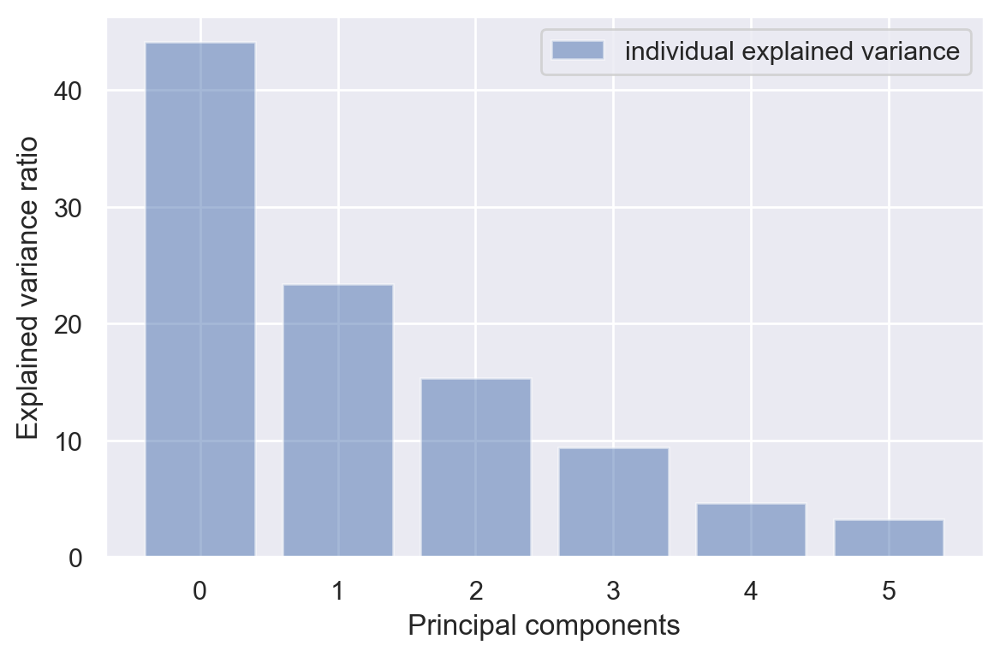

In [261]:
mean_vec = np.mean(shapdf, axis=0)
cov_mat = (shapdf - mean_vec).T.dot((shapdf - mean_vec)) / (shapdf.shape[0] - 1)

eig_vals, eig_vecs = np.linalg.eig(cov_mat)

print("Eigenvectors \n%s" % eig_vecs)
print("\nEigenvalues \n%s" % eig_vals)


# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:, i]) for i in range(len(eig_vals))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort(key=lambda x: x[0], reverse=True)
tot = sum(eig_vals)
var_exp = [(i / tot) * 100 for i in sorted(eig_vals, reverse=True)]
len(var_exp)

sns.set(font_scale=1)
plt.figure(figsize=(6, 4))

plt.bar(
    range(6), var_exp, alpha=0.5, align="center", label="individual explained variance"
)
plt.ylabel("Explained variance ratio")
plt.xlabel("Principal components")
plt.legend(loc="best")
plt.tight_layout()

print(var_exp)

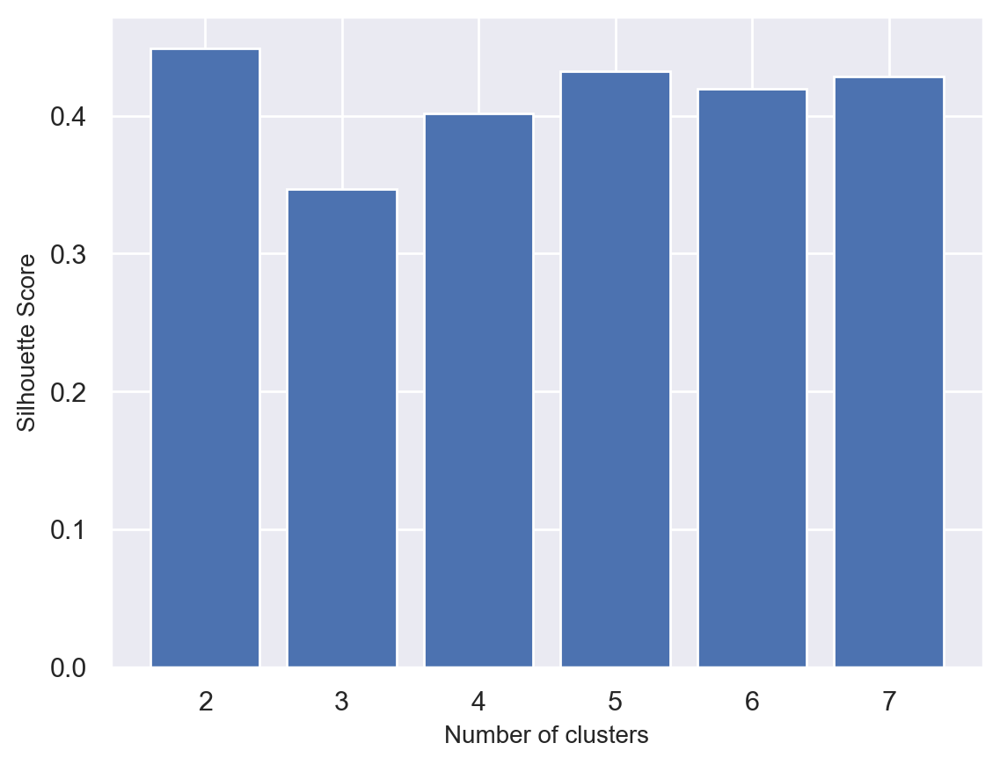

In [262]:
silhouette_scores = [] 

for n_cluster in range(2, 8):
    silhouette_scores.append( 
        silhouette_score(X_principal, AgglomerativeClustering(n_clusters = n_cluster).fit_predict(X_principal))) 
    
# Plotting a bar graph to compare the results 
k = [2, 3, 4, 5, 6,7] 
plt.bar(k, silhouette_scores) 
plt.xlabel('Number of clusters', fontsize = 10) 
plt.ylabel('Silhouette Score', fontsize = 10) 
plt.show() 

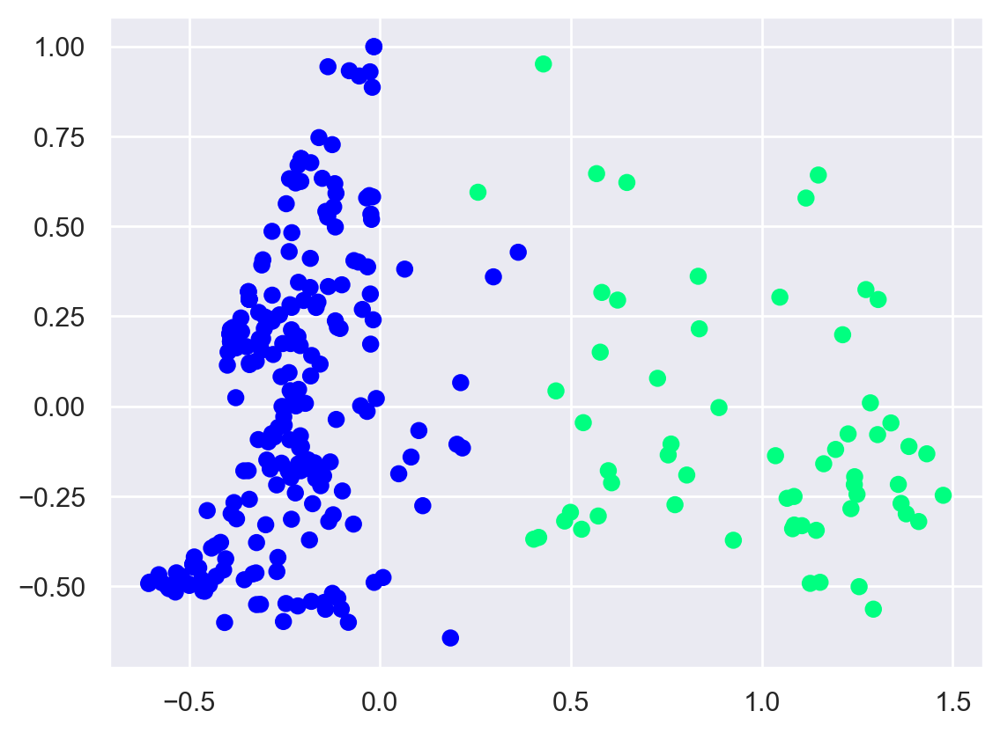

In [263]:
agg = AgglomerativeClustering(n_clusters=2)
agg.fit(X_principal)

sns.set(font_scale=1)
plt.scatter(
    X_principal["P1"],
    X_principal["P2"],
    c=AgglomerativeClustering(n_clusters=2).fit_predict(X_principal),
    cmap=plt.cm.winter,
)
plt.show()

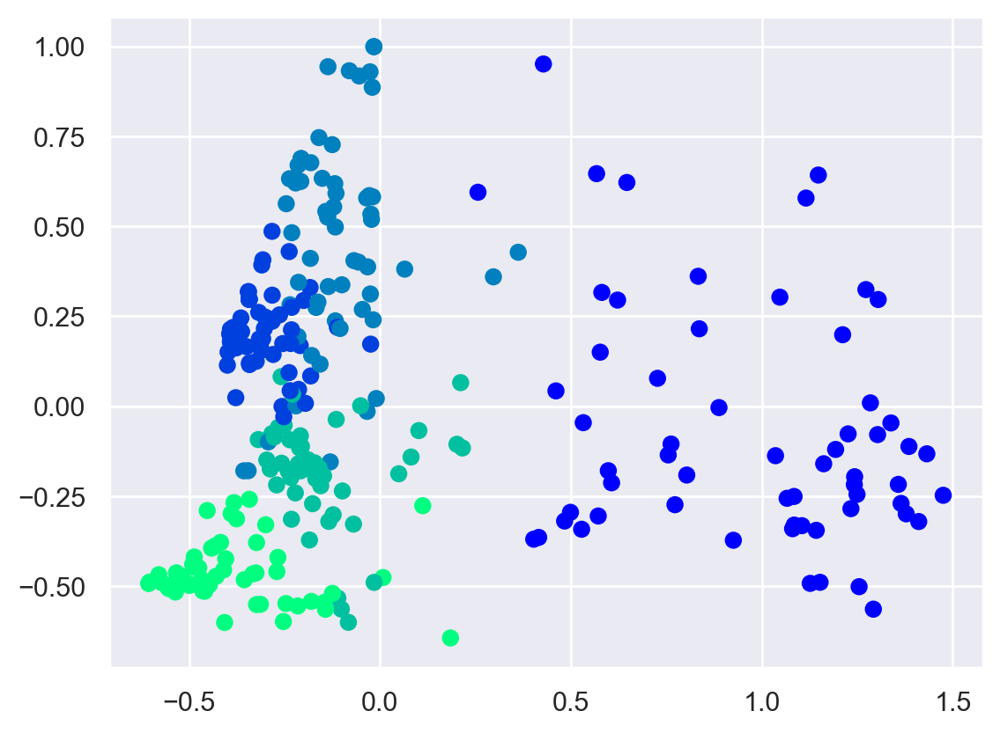

In [264]:
agg = AgglomerativeClustering(n_clusters=5)
agg.fit(X_principal)

sns.set(font_scale=1)
plt.scatter(
    X_principal["P1"],
    X_principal["P2"],
    c=AgglomerativeClustering(n_clusters=5).fit_predict(X_principal),
    cmap=plt.cm.winter,
)
plt.show()

## Unknown Gene Prediction

In [10]:
dataset_unknown = pd.read_csv("3l_predicted_data.txt", sep="\t")

df2 = dataset_unknown[
    [
       'HIPred', 'Heart - Atrial Appendage_GTExTPM', 'Pituitary_GTExTPM', 'mousescore_Exomiser', 'SDI', 'pLI_ExAC'
    ]
]

df2.shape

(1804, 6)

In [11]:
imputer = MissForest(random_state=seed)
df3 = imputer.fit_transform(df2)

Iteration: 0
Iteration: 1


In [12]:
X2 = pd.DataFrame(df3, index=df2.index, columns=df2.columns)

X2.shape

(1804, 6)

In [13]:
model = cb
cal_clf = CalibratedClassifierCV(cb, method="sigmoid", cv="prefit")
cal_clf.fit(X, Y, sample_weight=classes_weights_all)
#model.fit(X, Y, sample_weight=classes_weights_all)
predictions = list(cal_clf.predict(X2))

output = pd.Series(data=predictions, index=dataset_unknown.index, name="cb_label")

df_total = pd.concat([dataset_unknown, output], axis=1)

In [14]:
class_preds =  list(model.predict(X2))


output = pd.Series(data=class_preds, index=dataset_unknown['Gene'], name="cb_label")

output = output.to_frame()
output.reset_index(level=0, inplace=True)

output.to_csv('13-07_three_label_classes.csv')

In [15]:
output = pd.Series(data=class_preds, name="cb_label")

df_hipred = pd.concat([dataset_unknown, output], axis=1)

In [16]:
predictions =  list(model.predict_proba(X2))
predictions = pd.DataFrame(predictions, columns=['most likely','probable', 'least likely'])

df_total = pd.concat([dataset_unknown, predictions], axis=1)

In [17]:
df_total
df_file = df_total[["Gene","HIPred", "most likely", "probable", "least likely"]]
df_file.to_csv('13-07_HIPREDthree_label_preds.csv')

In [18]:
df_total.nlargest(10, "most likely", keep="last")

,Gene,REVEL.max,MetaSVM_rankscore.max,MetaLR_rankscore.max,MCAP.max,wgEncodeBroadHmmHuvecHMM.count,betamax,logpval_gwascatalog,Adipose - Subcutaneous_GTExTPM,Adipose - Visceral (Omentum)_GTExTPM,...,MutationAssessor_rankscore,REVEL_score,fathmm-MKL_coding_score,integrated_fitCons_rankscore,LoFtool,GERP_Rankscore,BPlabel,most likely,probable,least likely
827,MLIP,0.000,0.354,0.075,NaN,10,-0.1964,13.000000,0.673251,0.293427,...,0.97045,0.508,0.98749,0.97801,0.2800,0.81769,unknown,0.925518,0.057783,0.016698
692,JPH2,NaN,NaN,NaN,NaN,88,-0.4207,16.221849,6.035550,5.141700,...,0.06538,0.099,0.89120,0.14033,0.0898,0.90390,unknown,0.846874,0.134244,0.018883
909,NOTCH3,NaN,NaN,NaN,NaN,30,-0.1343,15.397940,157.834000,74.997900,...,NaN,NaN,NaN,NaN,0.3630,NaN,unknown,0.836040,0.148993,0.014967
854,MRVI1,0.054,0.373,0.031,NaN,409,-0.5660,53.000000,41.753100,19.800600,...,NaN,0.137,0.92385,0.21443,0.8300,0.94564,unknown,0.830294,0.158955,0.010751
362,CSRP3,NaN,NaN,NaN,NaN,591,0.3833,10.397940,0.196411,0.188677,...,NaN,NaN,NaN,NaN,0.3410,NaN,unknown,0.814783,0.153198,0.032019
1444,SGCD,NaN,NaN,NaN,NaN,280,0.2110,10.000000,3.075140,2.000780,...,NaN,NaN,NaN,NaN,0.2760,NaN,unknown,0.814162,0.169945,0.015893
52,ADAMTS7,0.119,0.448,0.000,NaN,44,0.4432,33.397940,13.224000,10.280600,...,NaN,NaN,NaN,NaN,0.1700,NaN,unknown,0.799983,0.183425,0.016592
306,CHRM2,NaN,NaN,NaN,NaN,494,0.4323,12.000000,0.004196,0.023050,...,NaN,NaN,NaN,NaN,NaN,NaN,unknown,0.792089,0.188069,0.019842
331,COL15A1,0.412,0.876,0.880,NaN,33,-0.3010,23.301030,126.192000,75.095400,...,NaN,NaN,NaN,NaN,0.2320,NaN,unknown,0.788011,0.190046,0.021943
1191,RAMP2,NaN,NaN,NaN,NaN,205,-0.2891,10.698970,264.803000,200.334000,...,NaN,NaN,NaN,NaN,0.2160,NaN,unknown,0.786427,0.155833,0.057740


In [19]:
df_total.nlargest(10, "probable", keep="last")

,Gene,REVEL.max,MetaSVM_rankscore.max,MetaLR_rankscore.max,MCAP.max,wgEncodeBroadHmmHuvecHMM.count,betamax,logpval_gwascatalog,Adipose - Subcutaneous_GTExTPM,Adipose - Visceral (Omentum)_GTExTPM,...,MutationAssessor_rankscore,REVEL_score,fathmm-MKL_coding_score,integrated_fitCons_rankscore,LoFtool,GERP_Rankscore,BPlabel,most likely,probable,least likely
739,LEF1,NaN,NaN,NaN,NaN,9,-0.3043,19.000000,0.969382,1.563310,...,NaN,NaN,NaN,NaN,0.16400,NaN,unknown,0.060686,0.920645,0.018669
1572,SYT1,NaN,NaN,NaN,NaN,22,-0.4143,18.397940,0.654250,0.597805,...,0.67893,0.282,0.98665,0.92422,0.48400,0.86480,unknown,0.055718,0.919294,0.024988
595,GRM7,0.117,0.347,0.0,NaN,64,-0.3350,10.397940,0.228438,0.062915,...,0.93460,0.883,0.99863,0.34471,0.00124,0.95888,unknown,0.047732,0.915511,0.036757
594,GRM4,NaN,NaN,NaN,NaN,129,0.3484,22.397940,0.017517,0.020754,...,0.73286,0.891,0.98308,0.82227,0.03530,0.61401,unknown,0.058979,0.914908,0.026113
841,MPPED2,NaN,NaN,NaN,NaN,462,-0.3409,17.522879,1.072720,0.968080,...,0.33814,0.521,0.98419,0.25195,0.09660,0.88690,unknown,0.063108,0.913554,0.023338
462,ELAVL3,NaN,NaN,NaN,NaN,2,-0.2010,7.397940,0.050540,0.055920,...,NaN,NaN,NaN,NaN,0.70600,NaN,unknown,0.059096,0.912313,0.028591
1575,TAF5,NaN,NaN,NaN,NaN,1234,-0.3659,17.096910,4.598660,4.118080,...,NaN,NaN,NaN,NaN,0.53100,NaN,unknown,0.078979,0.900575,0.020446
828,MLLT3,NaN,NaN,NaN,NaN,567,0.4760,12.698970,4.276940,3.814820,...,NaN,NaN,NaN,NaN,0.04150,NaN,unknown,0.086991,0.896862,0.016147
615,HELLS,NaN,NaN,NaN,NaN,149,0.2564,37.522879,0.821547,0.724538,...,0.85872,0.344,0.95304,0.30671,0.90000,0.49153,unknown,0.075554,0.896610,0.027836
4,ABHD17C,NaN,NaN,NaN,NaN,52,0.4113,23.397940,2.380560,2.489750,...,NaN,NaN,NaN,NaN,NaN,NaN,unknown,0.079127,0.895005,0.025867


In [20]:
df_total.nlargest(10, "least likely", keep="last")

,Gene,REVEL.max,MetaSVM_rankscore.max,MetaLR_rankscore.max,MCAP.max,wgEncodeBroadHmmHuvecHMM.count,betamax,logpval_gwascatalog,Adipose - Subcutaneous_GTExTPM,Adipose - Visceral (Omentum)_GTExTPM,...,MutationAssessor_rankscore,REVEL_score,fathmm-MKL_coding_score,integrated_fitCons_rankscore,LoFtool,GERP_Rankscore,BPlabel,most likely,probable,least likely
1010,OR5I1,0.161,0.500,0.001,NaN,13,0.2358,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,unknown,0.014494,0.037629,0.947877
991,OR5AS1,0.004,0.171,0.000,NaN,39,0.1434,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,0.905,NaN,unknown,0.014494,0.037629,0.947877
993,OR5B12,NaN,NaN,NaN,NaN,201,-0.3963,8.000000,0.0,0.0,...,NaN,NaN,NaN,NaN,0.823,NaN,unknown,0.015699,0.037022,0.947278
1799,ZNF92P2,NaN,NaN,NaN,NaN,10,0.2253,NaN,0.0,0.0,...,0.45129,0.012,0.01656,0.14033,NaN,0.19456,unknown,0.017699,0.042557,0.939744
1751,ZBED1P1,NaN,NaN,NaN,NaN,92,0.2428,10.096910,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,unknown,0.017699,0.042557,0.939744
1741,XXbac-BPGBPG24O18.1,NaN,NaN,NaN,NaN,42,0.2681,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,unknown,0.017699,0.042557,0.939744
1716,VN1R11P,NaN,NaN,NaN,NaN,53,-0.1815,26.045757,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,unknown,0.017699,0.042557,0.939744
1702,UQCRHP1,NaN,NaN,NaN,NaN,91,0.2101,55.154902,0.0,0.0,...,0.20218,0.025,0.00585,0.32371,0.404,0.03764,unknown,0.017699,0.042557,0.939744
1689,UBTFL7,NaN,NaN,NaN,NaN,66,0.5336,5.154902,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,unknown,0.017699,0.042557,0.939744
1683,UBDP1,NaN,NaN,NaN,NaN,92,-0.5553,7.698970,0.0,0.0,...,NaN,NaN,NaN,NaN,0.789,NaN,unknown,0.017699,0.042557,0.939744


In [21]:
df_file = df_total[["Gene", "most likely", "probable", "least likely"]]
df_file = df_file.nlargest(1804, "least likely", keep="last")

In [22]:
df_file

,Gene,most likely,probable,least likely
1010,OR5I1,0.014494,0.037629,0.947877
991,OR5AS1,0.014494,0.037629,0.947877
993,OR5B12,0.015699,0.037022,0.947278
460,EIF2AP4,0.017699,0.042557,0.939744
1244,RP11-1029M24.1,0.017699,0.042557,0.939744
...,...,...,...,...
1638,TOP3A,0.402173,0.586998,0.010829
854,MRVI1,0.830294,0.158955,0.010751
463,ELK3,0.775680,0.214141,0.010180
665,IARS,0.522292,0.467988,0.009719


In [229]:
df_file.to_csv('13-07_three_label_preds.csv')

### Model Prediction Distribution:

In [74]:
ax = sns.distplot(df_total["cb_label"], kde=False, norm_hist=False)
ax.set_xlabel("Prioritisation label", fontsize=16)
ax.set_ylabel("Gene Count", fontsize=16)
ax.tick_params(labelsize=16)

KeyError: 'cb_label'

### SHAP Feature Importance Visualization:

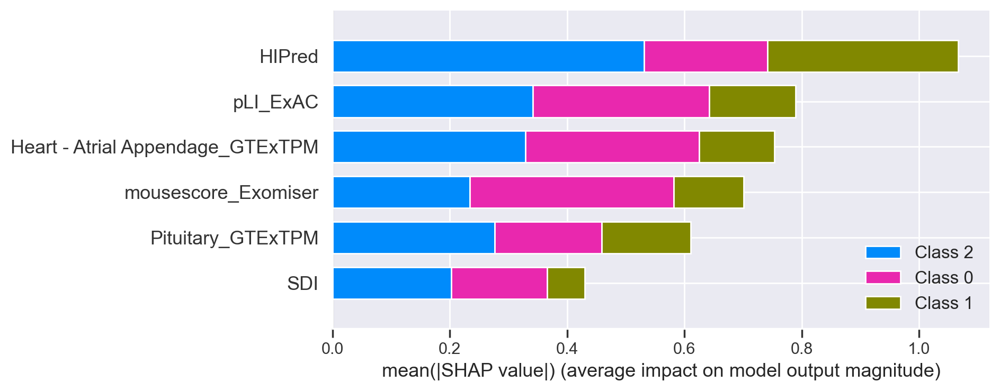

In [231]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X2)
shap.summary_plot(shap_values, X2)

In [232]:
expected_value = explainer.expected_value

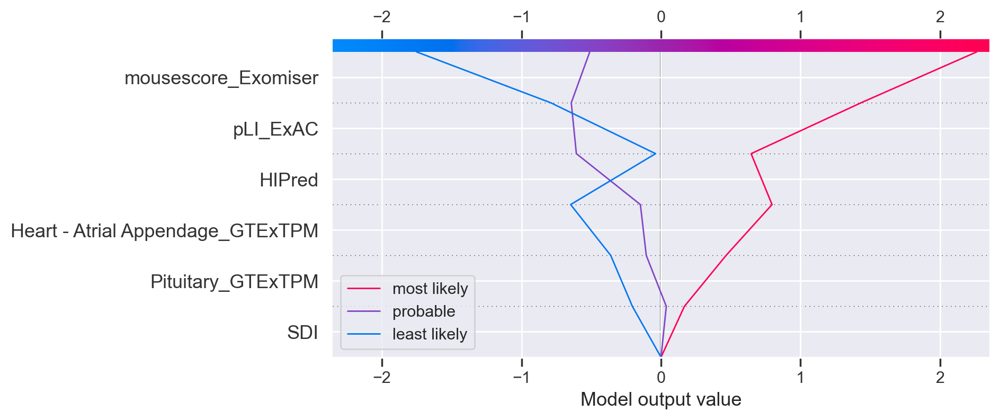

In [233]:
class_names =['most likely', 'probable', 'least likely']
row_index=827
shap.multioutput_decision_plot(
    explainer.expected_value,
    explainer.shap_values(X2),
    row_index=row_index,
    feature_names=list(X2),
    ignore_warnings=True,
    #highlight = predictions[row_index],
    legend_labels=class_names,
)

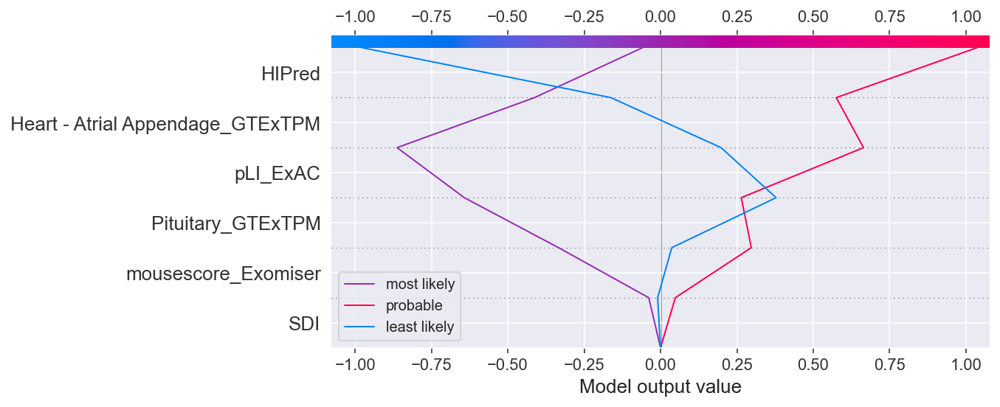

In [47]:
class_names =['most likely', 'probable', 'least likely']
row_index=738
shap.multioutput_decision_plot(
    explainer.expected_value,
    explainer.shap_values(X2),
    row_index=row_index,
    feature_names=list(X2),
    ignore_warnings=True,
    #highlight = predictions[row_index],
    legend_labels=class_names,
)

In [36]:
i=827
shap.force_plot(explainer.expected_value[0], shap_values[0][i], X2.values[i], feature_names = X.columns)

In [37]:
i=827
shap.force_plot(explainer.expected_value[1], shap_values[1][i], X2.values[i], feature_names = X.columns)

In [38]:
i=827
shap.force_plot(explainer.expected_value[2], shap_values[2][i], X2.values[i], feature_names = X.columns)

In [39]:
i=739
shap.force_plot(explainer.expected_value[0], shap_values[0][i], X2.values[i], feature_names = X.columns)

In [40]:
i=739
shap.force_plot(explainer.expected_value[1], shap_values[1][i], X2.values[i], feature_names = X.columns)

In [41]:
i=739
shap.force_plot(explainer.expected_value[2], shap_values[2][i], X2.values[i], feature_names = X.columns)

In [44]:
L=[1714, 561, 459, 476, 201, 828, 1607, 175, 611, 678]
X10 = X2.loc[L]

In [45]:
df10 = df_total.nlargest(10, "cb_label", keep="last")
df10 = df10 [[
        "Pituitary_GTExFC",
        "Lung_GTExTPM",
        "Liver_GTExTPM",
        "IPA_BP_annotation",
        "ExomiserScore",
        "Brain_Cortex_GTExFC",
        "Artery_Coronary_GTExFC",
        "Colon_Sigmoid_GTExFC",]]

In [46]:
select = range(8)
features = X10.iloc[select]
features_display = X10.loc[features.index]
shap_values = explainer.shap_values(X10)
shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[:10, :],
    X10.iloc[:10, :],
    features_display,
)

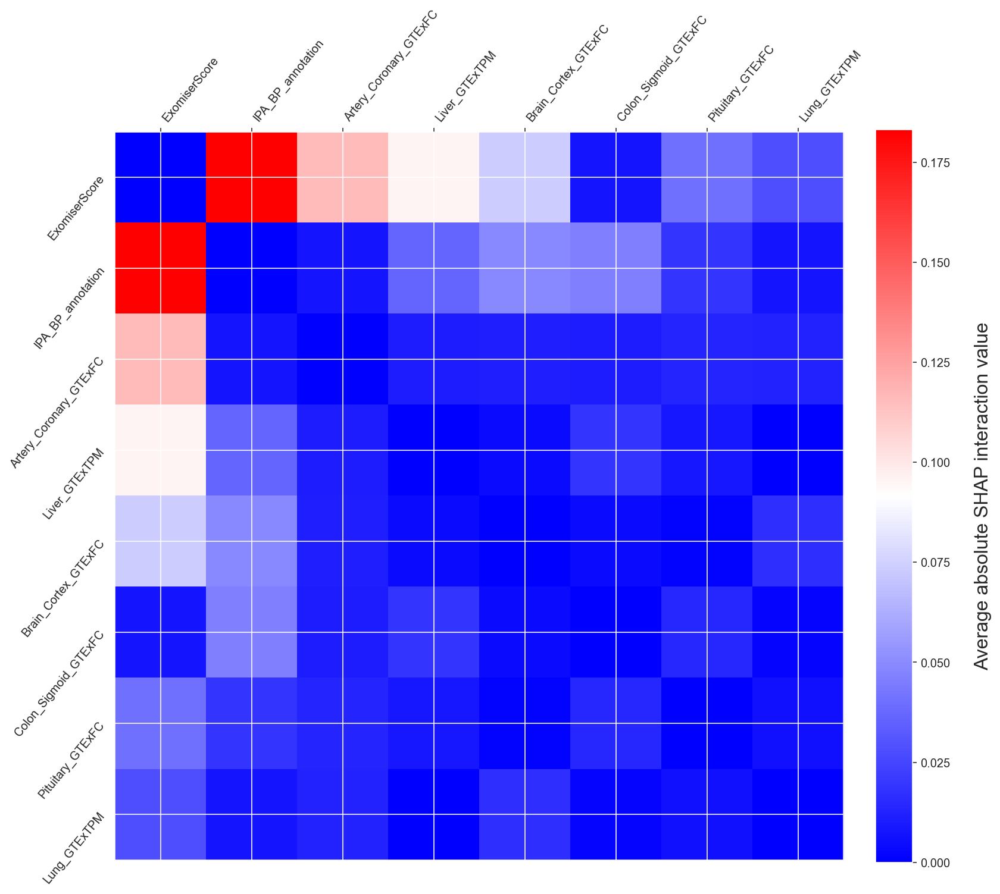

In [27]:
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(X10)
X_interaction10 = pd.DataFrame(data=X10, columns=df10.columns)


tmp = np.abs(shap_interaction_values).sum(0)
for i in range(tmp.shape[0]):
    tmp[i, i] = 0
inds = np.argsort(-tmp.sum(0))[:50]
tmp2 = tmp[inds, :][:, inds]
plt.figure(figsize=(12, 12))
plt.imshow(
    tmp2, cmap="bwr"
)  # https://matplotlib.org/stable/gallery/color/colormap_reference.html
plt.yticks(
    range(tmp2.shape[0]),
    X_interaction10.columns[inds],
    rotation=50.4,
    horizontalalignment="right",
)
plt.xticks(
    range(tmp2.shape[0]),
    X_interaction10.columns[inds],
    rotation=50.4,
    horizontalalignment="left",
)
plt.gca().xaxis.tick_top()
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label("Average absolute SHAP interaction value", size=16, labelpad=20)
plt.rcParams.update({"font.size": 16})
plt.show()

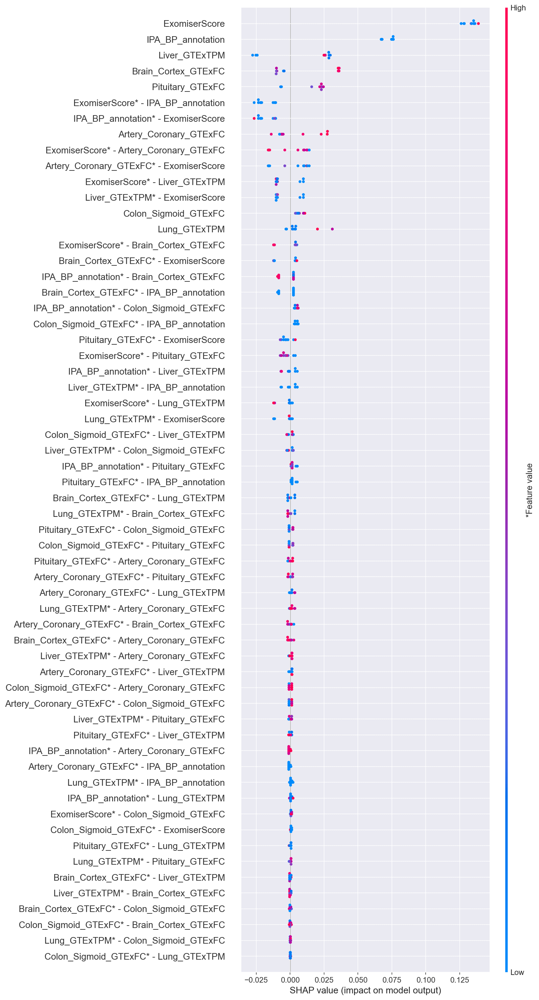

In [28]:
shap.summary_plot(
    shap_interaction_values, X10, max_display=60, plot_type="compact_dot"
)

In [29]:
shap.initjs()

# Write in a function
def shap_plot(j):
    explainerModel = shap.TreeExplainer(model)
    shap_values_Model = explainerModel.shap_values(X2)
    p = shap.force_plot(
        explainerModel.expected_value,
        shap_values_Model[j],
        X2.iloc[[j]],
        feature_names=df2.columns,
    )
    return p


shap_plot(1714)

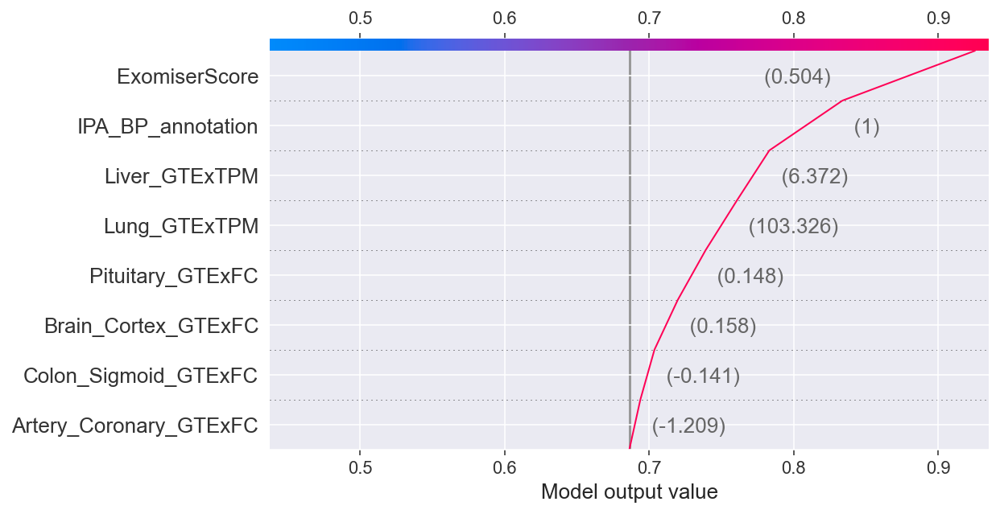

In [33]:
expected_value = explainer.expected_value
shap.decision_plot(expected_value, shap_values[1714], X2.iloc[1714])

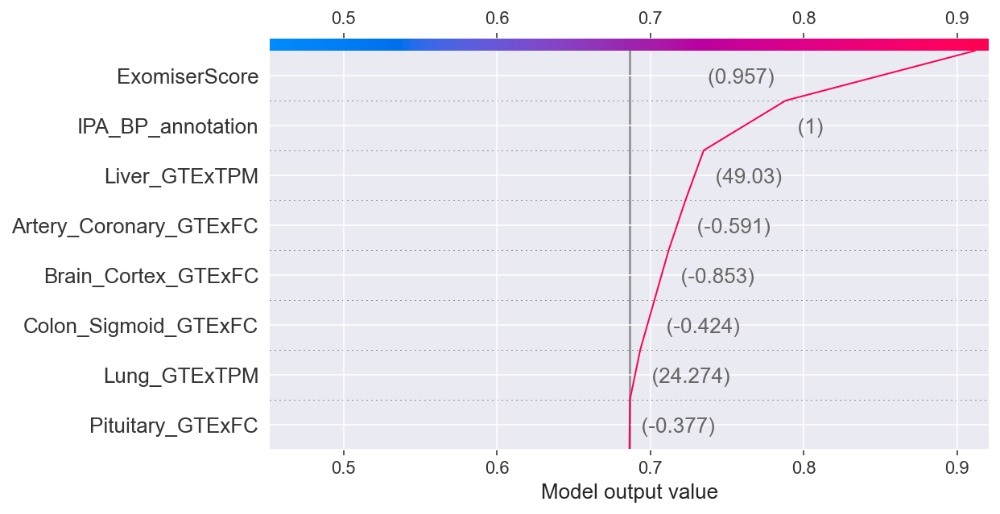

In [26]:
shap.decision_plot(expected_value, shap_values[561], X2.iloc[561])

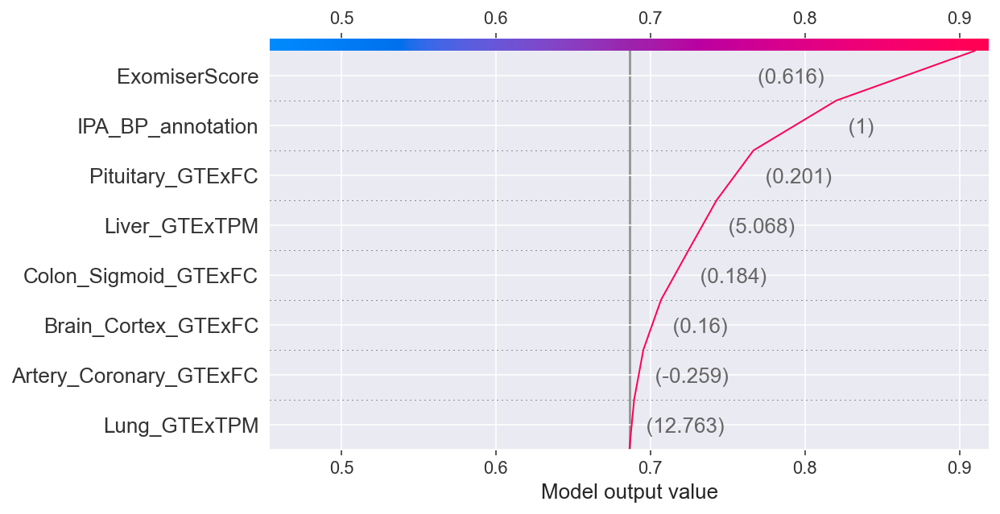

In [27]:
shap.decision_plot(expected_value, shap_values[459], X2.iloc[459])

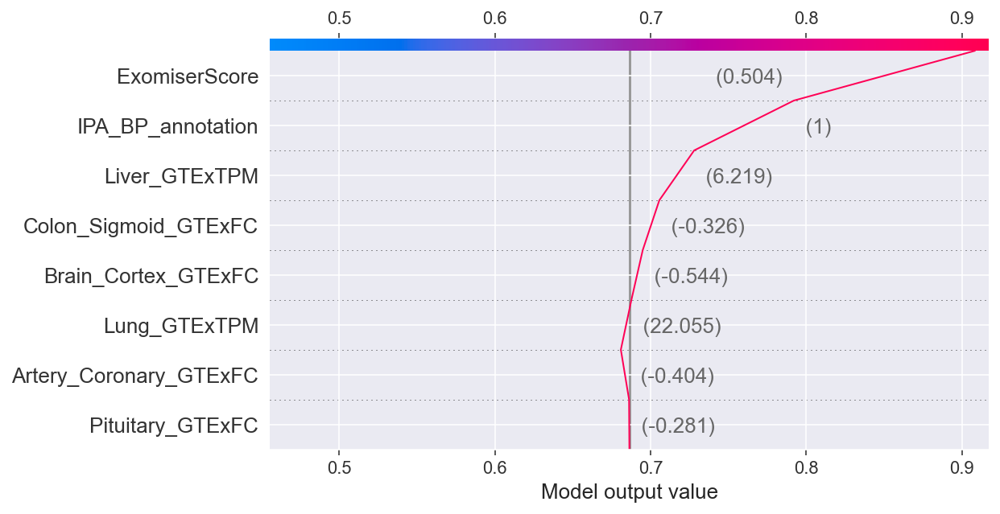

In [28]:
shap.decision_plot(expected_value, shap_values[476], X2.iloc[476])

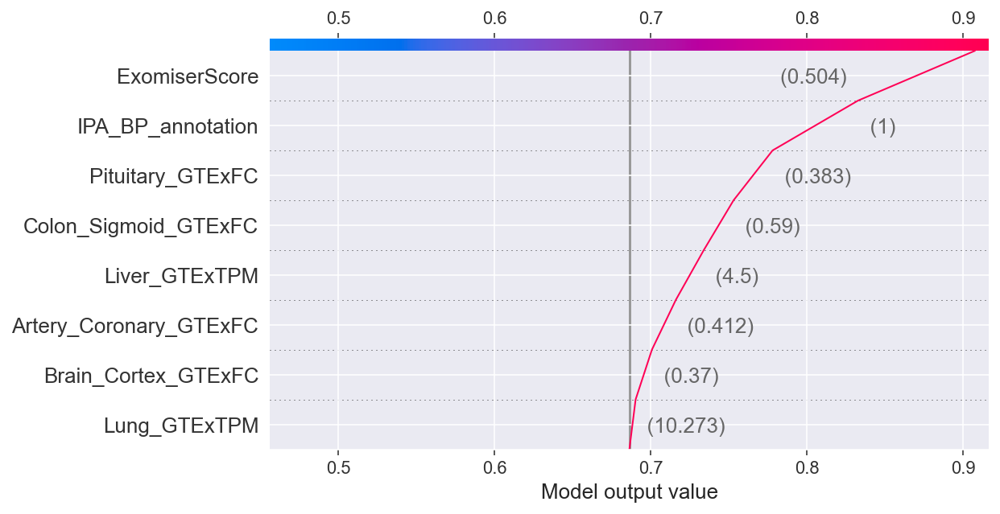

In [29]:
shap.decision_plot(expected_value, shap_values[201], X2.iloc[201])

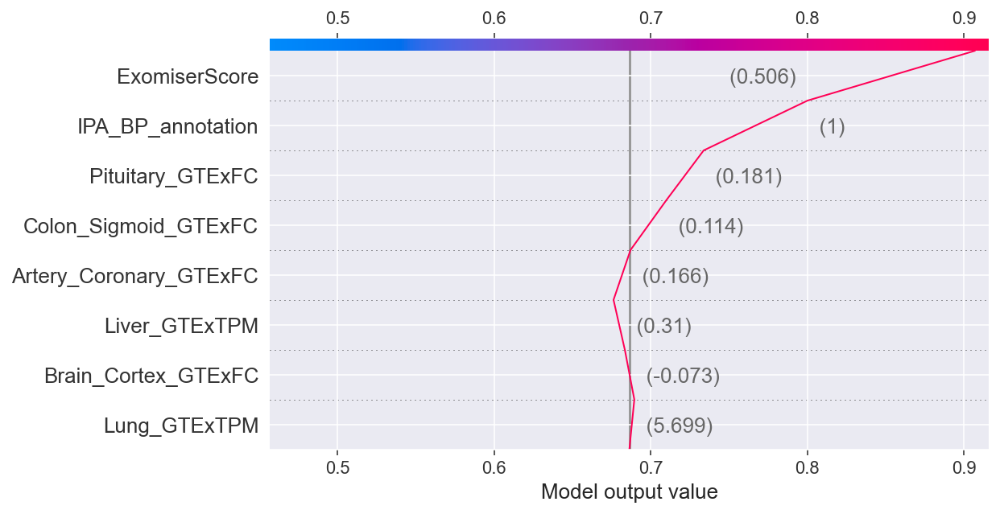

In [25]:
shap.decision_plot(expected_value, shap_values[828], X2.iloc[828])

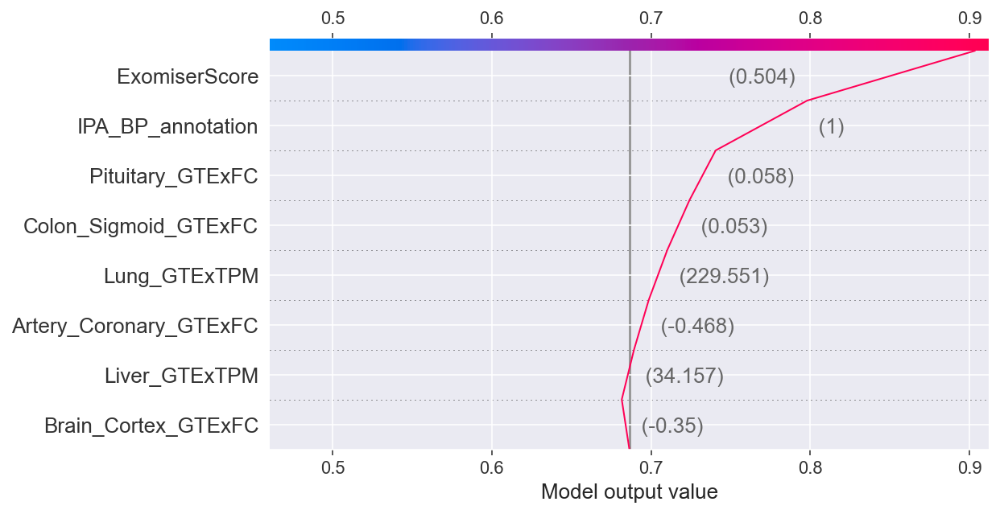

In [58]:
shap.decision_plot(expected_value, shap_values[1607], X2.iloc[1607])

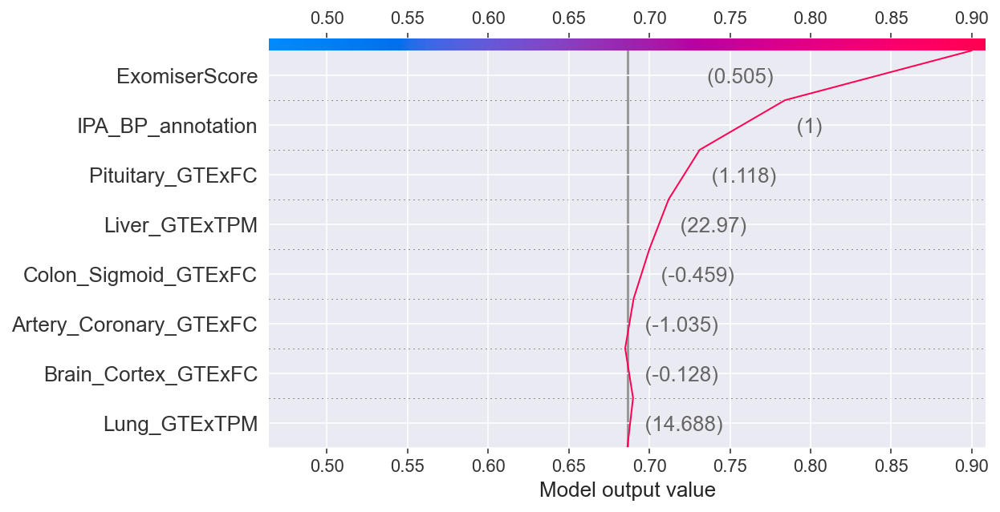

In [59]:
shap.decision_plot(expected_value, shap_values[678], X2.iloc[678])

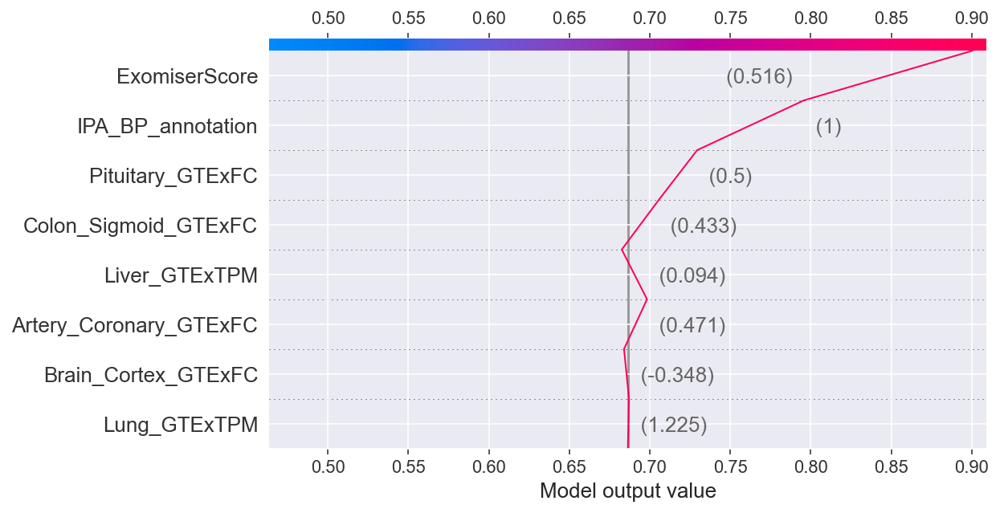

In [34]:
shap.decision_plot(expected_value, shap_values[611], X2.iloc[611])

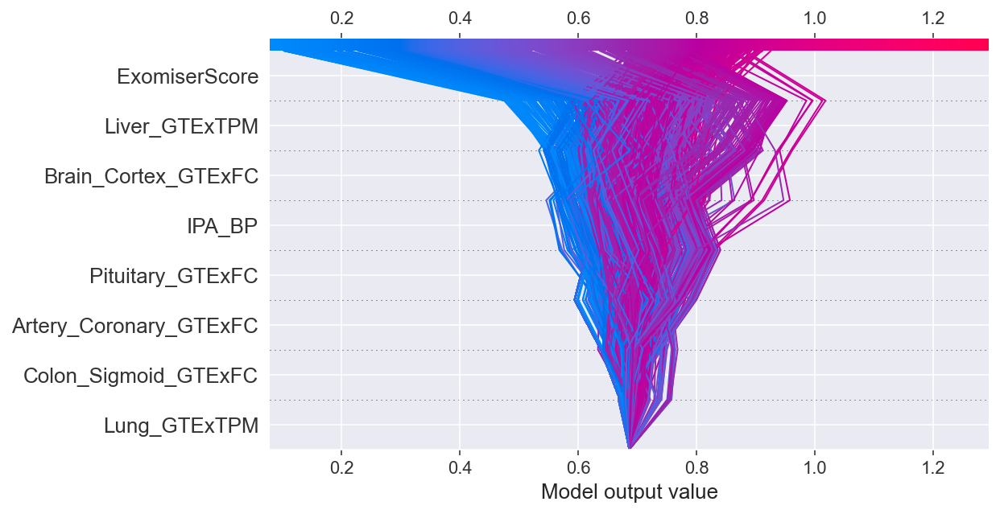

In [74]:
shap.decision_plot(expected_value, shap_values, X2)

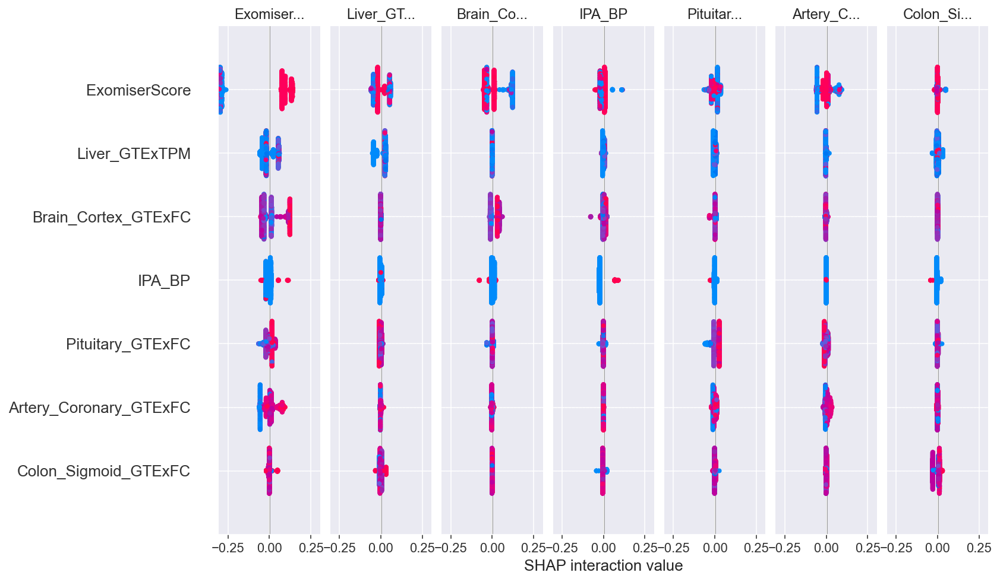

In [75]:
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(X2)
X_interaction2 = pd.DataFrame(data=X2, columns=df2.columns)
shap.summary_plot(shap_interaction_values, X_interaction2)

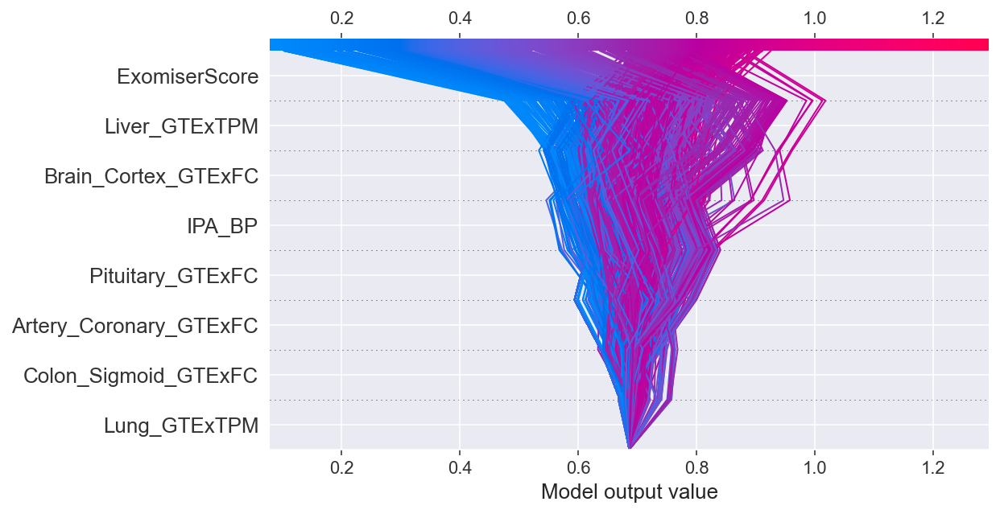

In [76]:
shap.decision_plot(expected_value, shap_values, features_display, ignore_warnings=True)

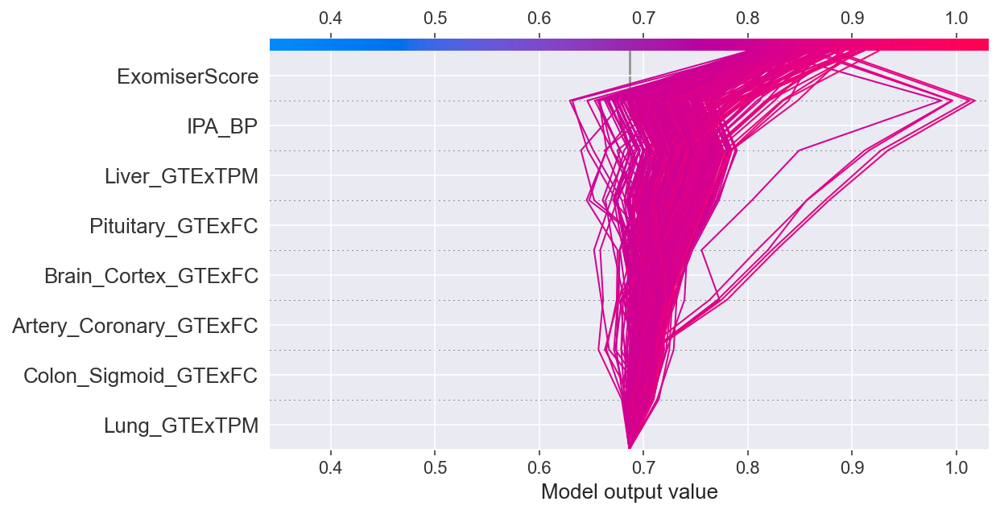

In [77]:
y_pred = cb.predict(X2)
T = X2[(y_pred >= 0.8)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

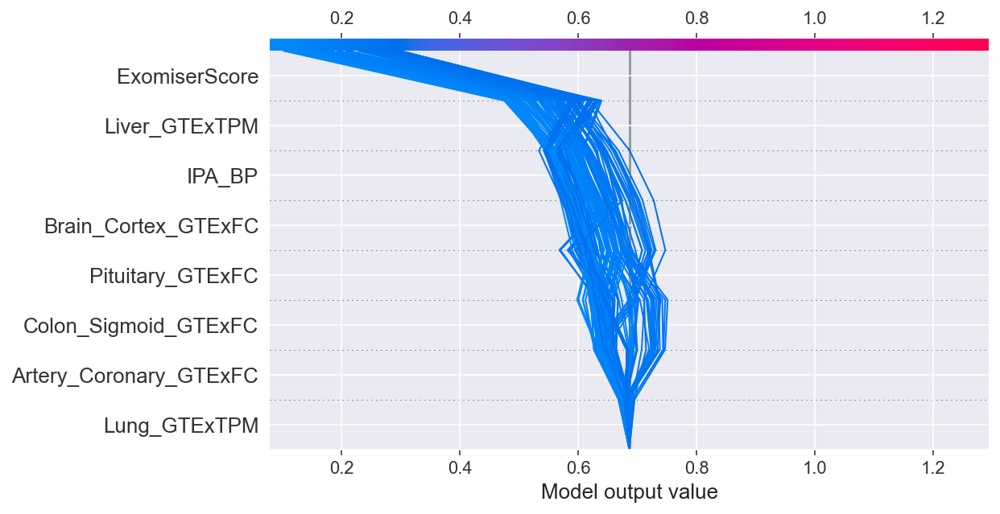

In [78]:
y_pred = cb.predict(X2)
T = X2[(y_pred <= 0.3)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True, ignore_warnings=True)

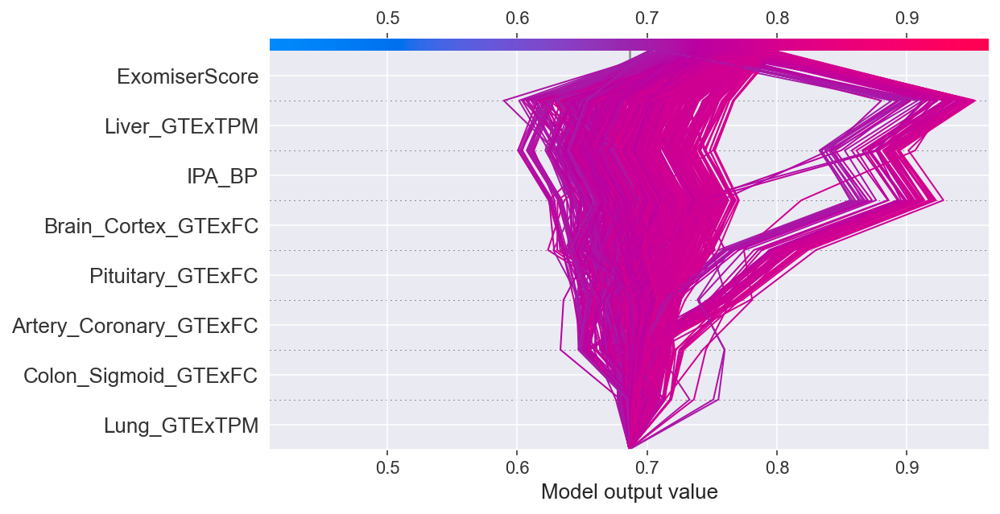

In [79]:
y_pred = cb.predict(X2)
T = X2[(y_pred >= 0.7) & (y_pred <= 0.8)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [76]:
smallest = df_total.nsmallest(10, "cb_label", keep="last")

smallest[['Gene', 'cb_label']]

,Gene,xgb_Score
1692,UFL1-AS1,0.102440
1316,RP11-382A20.7,0.102650
372,CTD-2033A16.3,0.102650
778,LY6G6F,0.103893
1320,RP11-432I5.2,0.104274
1360,RP11-734C14.2,0.104419
67,AGBL4,0.105703
1744,YBX1P6,0.107079
1403,RPS20P2,0.107079
1285,RP11-283G6.4,0.107079


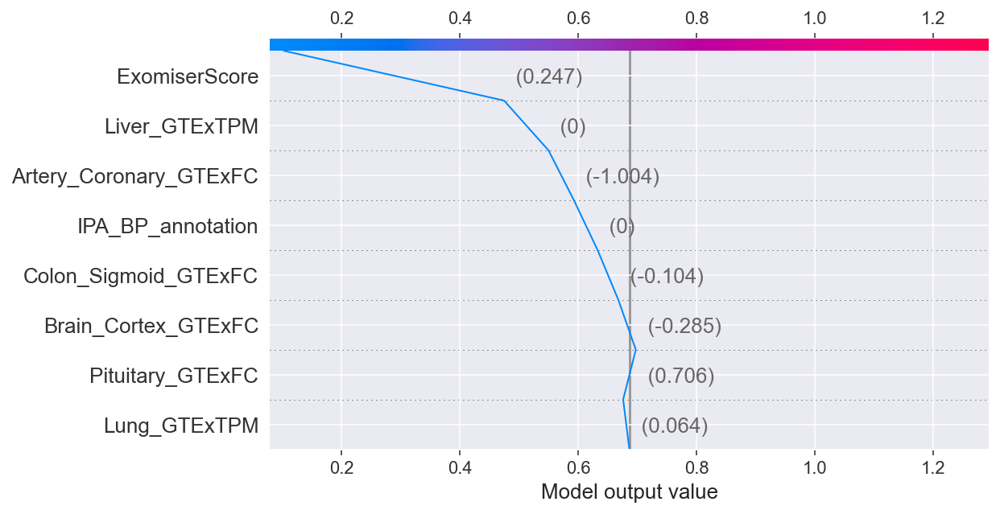

In [74]:
expected_value = explainer.expected_value
shap.decision_plot(expected_value, shap_values[1692], X2.iloc[1692])

In [82]:
gene1 = df_total[df_total["Gene"].str.contains("SUGCT")]
print(gene1)

       Gene  REVEL.max  MetaSVM_rankscore.max  MetaLR_rankscore.max  MCAP.max  \
1561  SUGCT       0.08                    NaN                   NaN       NaN   

      minP.min.min  minP.min.max  wgEncodeBroadHmmHuvecHMM.count  betamax  \
1561           NaN           NaN                             153  -0.6445   

      logpval_gwascatalog  ...  GTEx_signif_sexbias    HIPred  IPA_BP  \
1561                 24.0  ...                  1.0  0.195843       0   

      IPA_Activity  O_GlcNAc_Score  EMS_Max  PharmGKB_Score  \
1561             0             NaN      NaN             2.5   

      ExAc_constraint_obs_exp  BPlabel  xgb_Score  
1561                      NaN  unknown   0.826467  

[1 rows x 143 columns]


In [83]:
X_importance = X2
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_importance)

shap.initjs()

# Write in a function
def shap_plot(j):
    explainerModel = shap.TreeExplainer(model)
    shap_values_Model = explainerModel.shap_values(X2)
    p = shap.force_plot(
        explainerModel.expected_value,
        shap_values_Model[j],
        X2.iloc[[j]],
        feature_names=df2.columns,
    )
    return p


shap_plot(1561)

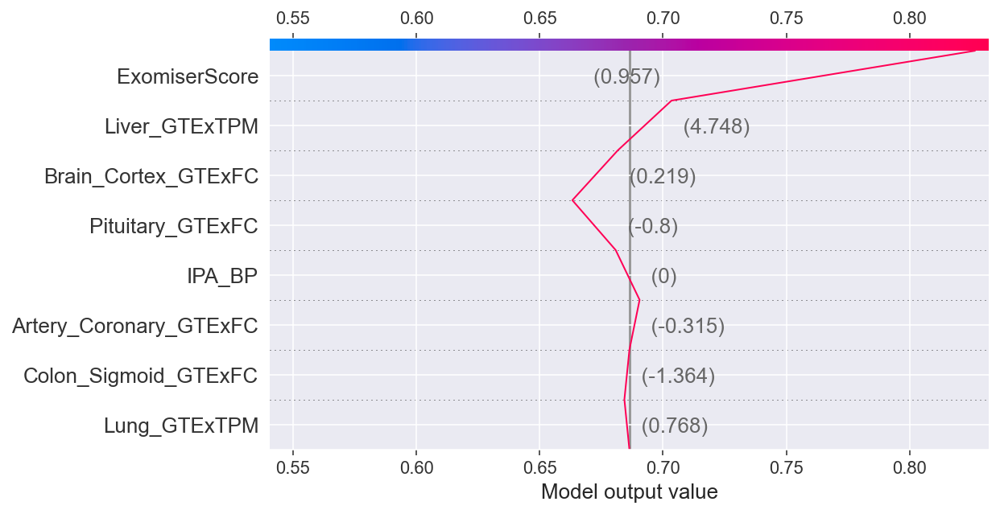

In [84]:
explainer = shap.TreeExplainer(model)

expected_value = explainer.expected_value
select = range(8)
features = X2.iloc[select]
features_display = X2.loc[features.index]
shap_values = explainer.shap_values(X2)
shap.decision_plot(
    expected_value, shap_values[1561], X2.iloc[1561], list(features_display)
)